# EDA for the Data set #
Prepared by: Danny Hinojosa
Dated: July 1, 2022

This notebook is a part of a series of Juptyer notebooks to create a predictive machine learning model. The purpose of this notebook is to analyze the cleaned dataset per the **Capstone - Data Clean** Notebook and to setup the data for modeling. The dataset was created from various sources to create a predictive model for revenue. This notebook will look at every feature in depth and determine how much of the information will be kept for the next step. Information will be quantified so that machine learning model can access the information. In this project, the Natural Language Processing (NPL) will be used on the synopsis on the latter notebooks. As such, this feature (column) will be the exception. 

The goal of the overall project is to create a predictive model for revenue and determine what features are important for the model's decision making. To that end, the quantified data and condensed information will be the goal of this notebook. 




## Table of Contents

[Introduction](#Introduction)

[Preliminary Review of the data](#Preliminary-review-of-the-data-and-determination-of-what-data-is-reflected-each-in-column)
    
[Evaluate each feature and data type](#Evaluate-each-feature-and-data-type)

- [Review Type feature](#Review-Type-feature)
- [Review Source feature](#Review-Source-feature)
- [Review Episodes feature](#Review-Episodes-feature)
- [Review Duration feature](#Review-Duration-feature)
- [Review Rating feature](#Review-Rating-feature)
- [Review Related feature](#Review-Related-feature)
- [Review Producer feature](#Review-Producer-feature)
- [Review Licensor feature](#Review-Licensor-feature)
- [Review Studio feature](#Review-Studio-feature)
- [Review Genre feature](#Review-Genre-feature)
- [Review Aired features](#Review-Aired-features)
- [Review Synopsis features](#Review-Synopsis-features)
- [Review Revenue features](#Review-Revenue-feature)
- [Review Animation Studio features](#Review-Animation-Studio-feature)
- [Review Publisher features](#Review-Publisher-feature)
- [Review Distributor features](#Review-Distributor-feature)

    
[Evaluate Missing Values](#Evaluate-Missing-Values)

[Evaluate Duplicated Values](#Evaluate-Duplicated-Values)

[Evaluate Distribution of continuous Features against Target](#Evaluate-Distribution-of-continuous-Features-against-Target)

[Evaluate for correlations](#Evaluate-for-correlations)

[Finalize Dataframe for Modeling](#Finalize-Dataframe-for-Modeling)

[Conclusion](#Conclusion)


## Introduction ##

The data was imported from a created comma-separated variable called *revised_capstone_data.csv*. The dataset contains information about anime properties such as title, genre, source, synopsis etc.. and revenues per anime title. The data was reviewed in the data cleaning portion of the project as shown in **Capstone - Data Clean** notebook. Data was cleaned to remove unnecessary features and combine datasets. Exploratory Data Analysis (EDA) and additional cleaning is required for the following step. The expected outcomes are some insights into the data and a new dataframe with quantified data, optimal transformed features where distribution is normalized, and condensed variables for categorical features.

It is noted that features is another word for data columns. 

As a part of the EDA and cleaning, the following will be examined:

1) Preliminary review of the data and determination of what data is reflected in each column

2) Evaluate each feature and data type

3) Evaluate null values

4) Evaluate duplicated values 

5) Evaluate distribution of variables within features

6) Evaluate for correlations 

7) Finalize dataframe for modeling


 

### Import required libraries ###
Python Libraries for main data science packages (pandas, numpy, and mathplotlib), data visualization, machine learning and various others. 

In [2]:
#Main Data Science libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#visualization
import seaborn as sns


# Additional python libraries
import re
import math

#Machine Learning Libraries
import ast 

### Import dataset ###

The dataset will be imported from *revised_data/revised_capstone_data.csv*.

In [3]:
#import dataset
df_import = pd.read_csv('revised_data/revised_capstone_data.csv')

## Preliminary review of the data and determination of what data is reflected each in column ###

Review will include the shape of the dataset and what each feature describes. Additionally, this will help determine what features can be dropped. 



In [4]:
#Check first 5 row between columns 0 to 11
display(df_import.iloc[:,0:11].head())

#Check first 5 row between columns 11 to 20
display(df_import.iloc[:,11:].head())

,anime_id,title,type,source,episodes,status,duration,rating,related,producer,licensor
0,7,witch hunter robin,TV,Original,26.0,Finished Airing,25 min. per ep.,PG-13 - Teens 13 or older,[],Bandai Visual,"Funimation, Bandai Entertainment"
1,16,hachimitsu to clover,TV,Manga,24.0,Finished Airing,23 min. per ep.,PG-13 - Teens 13 or older,"{'Adaptation': [{'mal_id': 1009, 'type': 'mang...","Genco, Fuji TV, Shueisha",Viz Media
2,18,initial d fourth stage,TV,Manga,24.0,Finished Airing,27 min. per ep.,PG-13 - Teens 13 or older,"{'Adaptation': [{'mal_id': 375, 'type': 'manga...","OB Planning, Studio Jack",Funimation
3,23,ring ni kakero 1,TV,Manga,12.0,Finished Airing,25 min. per ep.,PG - Children,"{'Adaptation': [{'mal_id': 14231, 'type': 'man...",NaN,NaN
4,24,school rumble,TV,Manga,26.0,Finished Airing,23 min. per ep.,PG-13 - Teens 13 or older,"{'Adaptation': [{'mal_id': 160, 'type': 'manga...","TV Tokyo, Sotsu, Marvelous, Starchild Records,...",Funimation


,studio,genre,aired_start,aired_end,revenue,2_synopsis,3_synopsis,Animation Studio,Publisher,Distributor
0,Sunrise,"Action, Magic, Police, Supernatural, Drama, My...",2002-07-02 00:00:00,2002-12-24 00:00:00,1186650.0,Witches are individuals with special powers li...,Witches are individuals with special powers li...,Sunrise,Bandai Visual,Bandai Visual
1,J.C.Staff,"Comedy, Drama, Josei, Romance, Slice of Life",2005-04-15 00:00:00,2005-09-27 00:00:00,3431025.0,"Yuuta Takemoto, a sophomore at an arts college...","Yuuta Takemoto, a sophomore at an arts college...",JC Staff,Asmik Ace,Kadokawa
2,A.C.G.T.,"Action, Cars, Sports, Drama, Seinen",2004-04-17 00:00:00,2006-02-18 00:00:00,13730025.0,Takumi Fujiwara finally joins Ryousuke and Kei...,Takumi Fujiwara finally joins Ryousuke and Kei...,A.C.G.T.,Avex,Avex
3,Toei Animation,"Action, Shounen, Sports",2004-10-06 00:00:00,2004-12-15 00:00:00,253875.0,"In order to fulfill their dead father's wish, ...","In order to fulfill their dead father's wish, ...",Toei Animation,Avex,Avex
4,Studio Comet,"Comedy, Romance, School, Shounen",2004-10-05 00:00:00,2005-03-29 00:00:00,2986650.0,"Just the words ""I love you,"" and everything ch...","Just the words ""I love you,"" and everything ch...",Studio Comet,Marvelous AQL,Media Factory


In [5]:
#Check data info and size
display(df_import.info(verbose=True))

shape = df_import.shape
print(f'\n Data set has {shape[0]} rows and {shape[1]} features')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2404 entries, 0 to 2403
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   anime_id          2404 non-null   int64  
 1   title             2404 non-null   object 
 2   type              2404 non-null   object 
 3   source            2404 non-null   object 
 4   episodes          2401 non-null   float64
 5   status            2397 non-null   object 
 6   duration          2391 non-null   object 
 7   rating            2391 non-null   object 
 8   related           2018 non-null   object 
 9   producer          1638 non-null   object 
 10  licensor          1247 non-null   object 
 11  studio            2327 non-null   object 
 12  genre             2397 non-null   object 
 13  aired_start       2402 non-null   object 
 14  aired_end         2386 non-null   object 
 15  revenue           2404 non-null   float64
 16  2_synopsis        2400 non-null   object 


None


 Data set has 2404 rows and 21 features


#### Features in the dataset ####

The features in the dataset contain the following data:

`anime_id` : old id key. This can be removed.

`title	`: Unique title of the show/movie.

`type	`: Type of anime i.e. movie or TV.

`source	`: The type of source or inspiration of the anime.

`episodes`: Number of total episodes.

`status	` : Airing status.

`duration`: Duration of the anime movie or epoisode.

`rating	` : TV rating i.e. PG, PG-13, R.

`related`: Dictionary of related shows to the anime. More exploration will be shown below.

`producer` : List of producers for each anime. Producers are separated by commas. 

`licensor`	: List of licensors for each anime. Licensors are separated by commas. 

`studio	` : Studio names for the show.

`genre	`: List of of genres for each anime. Genre separated by commas. 

`aired_start` : Date that the anime started (Y-M-D).

`aired_end	`: Date that the anime ended (Y-M-D). 

`2_synopsis	`: Provide short synopsis of the anime.

`3_synopsis	`: Provides a second synopsis of the anime. 

`Revenue	`: Revenue of the show or box office of the movie.

`Animation Studio` :  List of of animation studio for each anime.

`Publisher	` :  List of of publisher for each anime.  

`Distributor` :  List of of distributor for each anime.  



#### Drop Unnecessary Data ####
The `anime_id`and `status` column will be dropped. `anime_id` is a key. That was based on another dataset and is not relevant in this dataset. As such, this will be removed. `status` provides the show's air status when the data was web scrapped and as such it is misleading. 

In [6]:
# Drop 'anime_id'
df_import.drop(columns = ['anime_id','status'], inplace =True )

**Key notes:**

- `duration` requires revision as the time is stated as a string with various time parameter. It needs to be in numeric datatype.
- `related` is given in a dictionary. Further exploration is required. 
- `producer`, `licensor`, `genre` provide a list by comma. Will need to expand.
- `aired_start` and `aired_end` need to be datetime. 
- two `synopsis` were used. Consider combining the features.
- `publisher` and `distributor` need to be examined to determine if they can be merged with producer and licensor. Also, some research will need be conducted to know if the information is local to Japan.



## Evaluate each feature and data type ##





Each feature will be reviewed. The review will include insight into unique variables, distribution of the data, and confirmation of the data type. 

In [7]:
def quick_bar(df,col,title= 'none'):
    if title == 'none':
        title= col
    else:
        pass
    
    value_count_type = df[col].value_counts()
    plt. figure(figsize=(5,5),dpi=720)
    plt.barh(value_count_type.index,value_count_type.values)
    plt.title(f'Bar Chart of {title}', fontsize = 12)
    plt.xlabel('Count', fontsize = 10)
    plt.ylabel(f'{title}', fontsize = 10);
    

In [8]:
def quick_histogram(df,col,bins_='auto', title='none'):
    if title == 'none':
        title= col
    else:
        pass
    
    value_count_type = df[col].value_counts()
    plt. figure(figsize=(5,5), dpi=720)
    sns.histplot(df[col],bins=bins_)
    plt.title(f'Histogram Chart of {title}', fontsize = 12)
    plt.ylabel('Count', fontsize = 10)
    plt.xlabel(f'{title}', fontsize = 10);

### Review Type feature ###

The data under `type` will be reviewed for unique values and the distribution of the data will be reviewed. 

TV         1748
Movie       413
OVA         105
ONA          64
Special      55
Music        10
Unknown       9
Name: type, dtype: int64

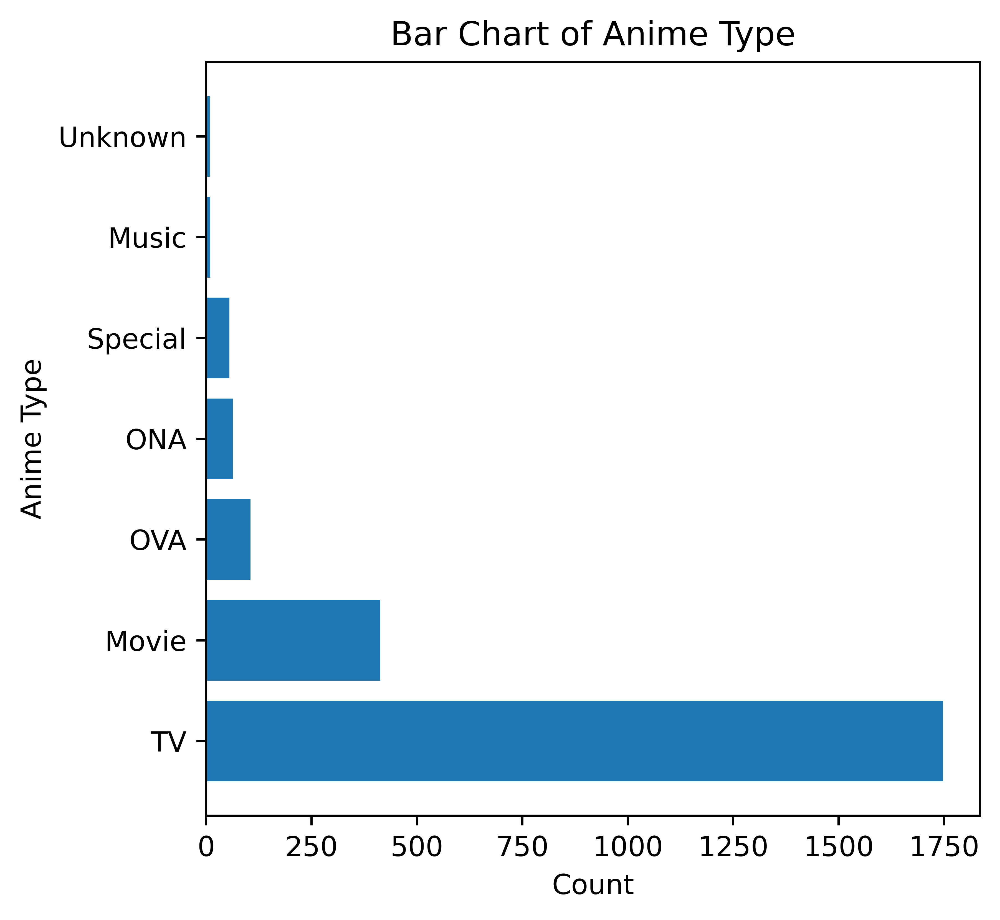

In [9]:
# Review value count
display(df_import['type'].value_counts())
(quick_bar(df_import,'type', 'Anime Type'))
 

For `types`, the following values are possible: 
- TV, 
- Films, 
- OVA (original video animation), 
- ONA (original network anime), 
- Special, 
- Unknown, 
- Music 

**Key take away**
- Data type is correctly noted as object.

- Specials, OVA and ONA can be grouped together as Other as these types are low in count and are distinct from movies and tv show. 

- Distribution is in favor of TV and Movie. To decrease distribution, all other shows will be revised to Other. 

- Given only 9 data is labeled as Unknown, the type will be revised to Other.


In [10]:
#Revise OVA and ONA
df_import.loc[((df_import['type']=='ONA') | (df_import['type']=='OVA')),'type'] = 'Other'

#Revise Music
df_import.loc[(df_import['type']=='Music'),'type'] = 'Other'


#Revise Special  
df_import.loc[(df_import['type']=='Special'),'type'] = 'Other'

#Revise Unknown  
df_import.loc[(df_import['type']=='Unknown'),'type'] = 'Other'


In [11]:
#Check change has been made
print('The distribution of the anime are as follows by percentage: ')
display(df_import['type'].value_counts()/df_import['type'].shape[0]*100)

The distribution of the anime are as follows by percentage: 


TV       72.712146
Movie    17.179700
Other    10.108153
Name: type, dtype: float64

Changes has been made and distribution is adequate. The following feature `Source` will be reviewed next. 

### Review Source feature ###

The data under `Source` will be reviewed for unique values and the distribution of the data will be analyzed. 

Manga            887
Original         469
Light novel      348
Game             149
Visual novel     144
Unknown           90
4-koma manga      87
Novel             85
Web manga         55
Other             41
Card game         21
Music             15
Picture book       6
Book               3
Digital manga      2
Radio              1
Mixed media        1
Name: source, dtype: int64

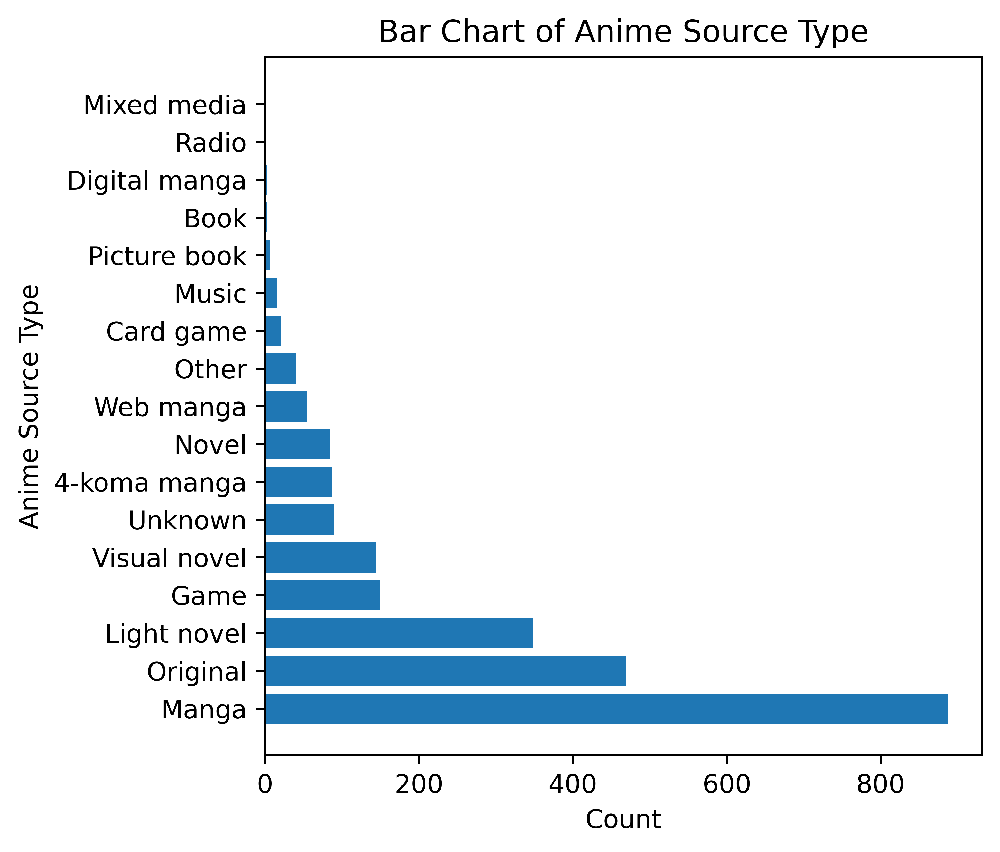

In [12]:
# Review value count and plot distribtuion 
display(df_import['source'].value_counts())
(quick_bar(df_import,'source', 'Anime Source Type'))
 

For `Source`, the following values are possible: 
- Manga            
- Original         
- Light novel      
- Game             
- Visual novel     
- 4-koma manga     
- Unknown           
- Novel             
- Web manga         
- Other             
- Card game         
- Music             
- Picture book       
- Book               
- Digital manga      
- Radio              
- Mixed media        

**Key take away**
- Data type is correctly noted as object.

- Distribution is in favor of Light novel, Original, and Manga. To decrease distribution, common source types shall be grouped to increase variance. 

- Various source types noted as subset of manga shall be paired as Other Manga.

- Various source types noted as subset of novels and books besides Light Novel shall be paired as Other Novel/Book.

- Various source types noted as games or subset of games shall be paired as Game.

- All other source types will be revised to other.

In [13]:
# Revise the source names 
#Other manga
df_import.loc[((df_import['source']=='Digital manga')|(df_import['source']=='4-koma manga')|(df_import['source']=='Web manga'),
               'source')] = 'Other manga'

#Other Novels/Book 
df_import.loc[((df_import['source']== 'Picture book')|(df_import['source']== 'Visual novel')|(df_import['source']== 'Book')\
              |(df_import['source']== 'Novel')), 'source'] = 'Other Novel/Book'

#Games
df_import.loc[((df_import['source']== 'Card game')),'source'] = 'Game'

#Others
df_import.loc[((df_import['source']== 'Mixed media')|(df_import['source']== 'TV')|\
           (df_import['source']== 'Radio')|(df_import['source']== 'Music')|\
           (df_import['source']== 'Unknown')),'source'] = 'Other' 

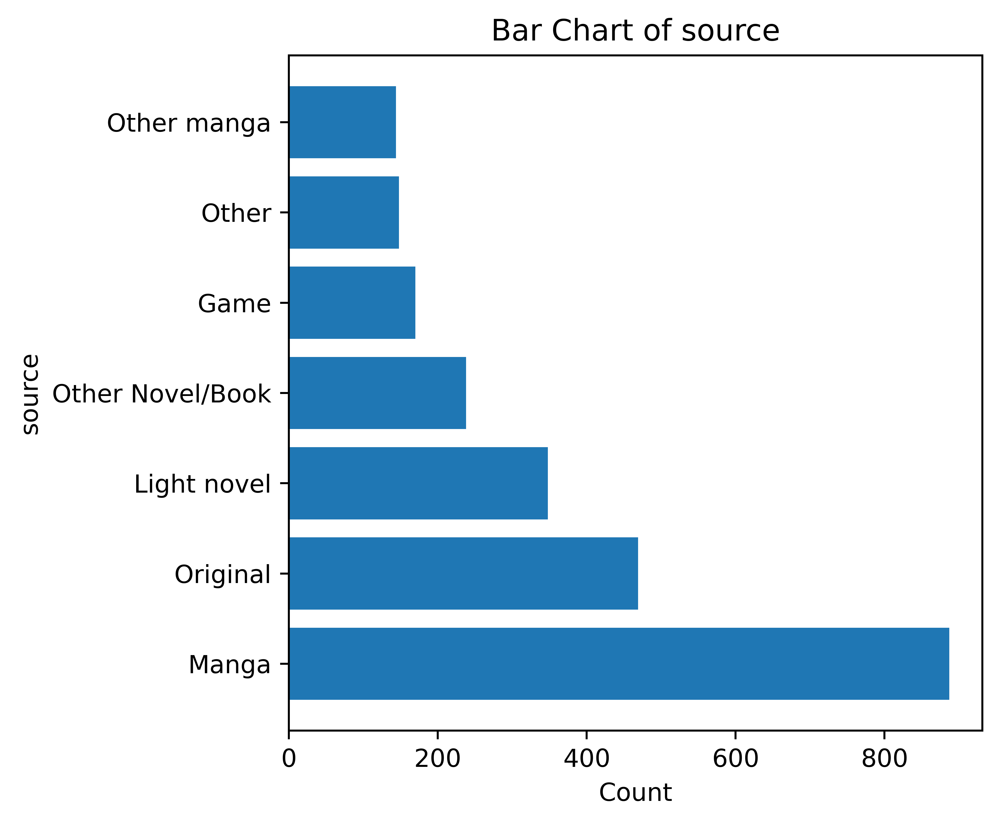

In [14]:
quick_bar(df_import,'source')

Changes has been made and distribution is adequate. The following feature `episodes` will be reviewed next. 

### Review Episodes feature ###

The data under `episodes` will be reviewed. Values and distribution will be reviewed.  

Statistical data:


count    2401.000000
mean       11.558934
std         9.529995
min         0.000000
25%         1.000000
50%        12.000000
75%        13.000000
max       104.000000
Name: episodes, dtype: float64

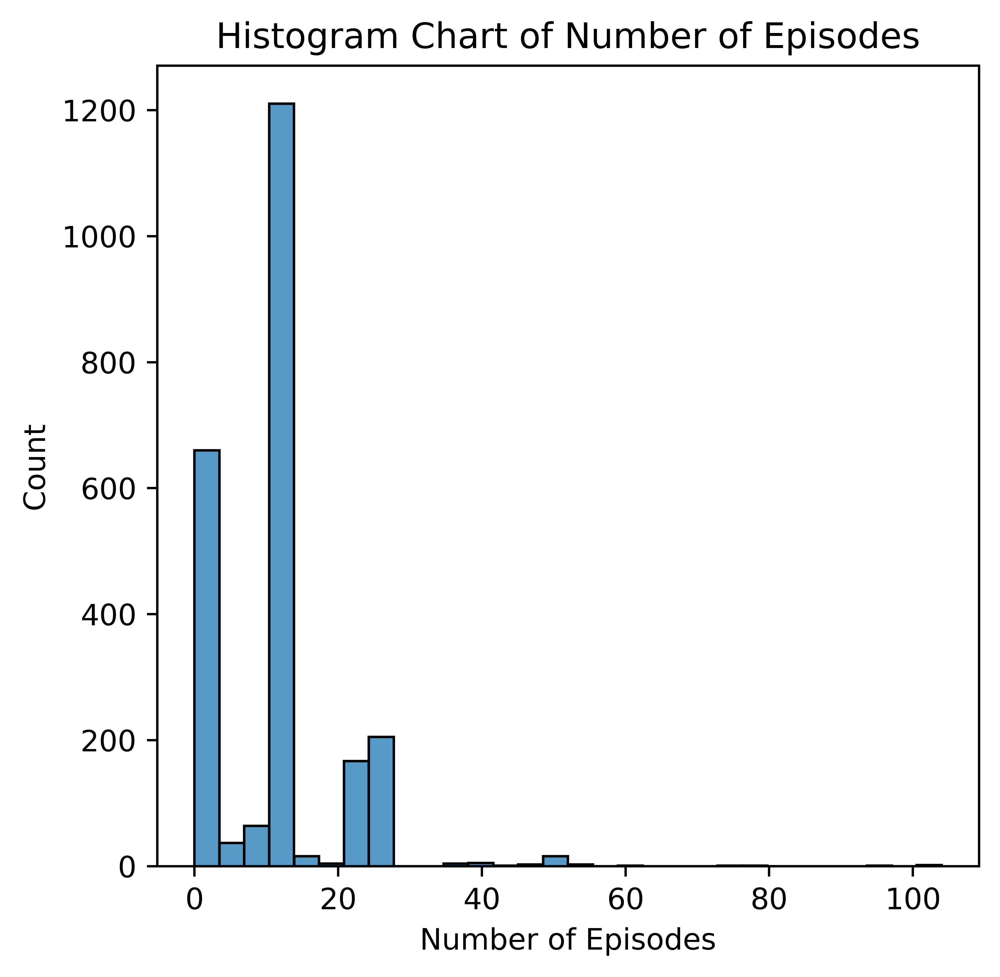

In [15]:
# Review distribution of the episode data
print('Statistical data:')
display(df_import['episodes'].describe())
quick_histogram(df_import,'episodes',bins_=30, title='Number of Episodes')

**Key take away**
- Data type is correctly noted as float.

- Distribution heavily distributed between 1 and 20. 

- Noted median is 12 minutes per episode.

- Distribution is right skewed. This is likely due to high number of TV shows. Transformation of the data using the natural logarithm (log) will help to normalize the data.  

#### Change 0 values to null

In [16]:
#Condition
condition_duration_0 = df_import['episodes']==0
df_import.loc[condition_duration_0,'episodes'] = np.nan

**Create a natural logarithm of `episodes`**

The `episodes` feature will be transformed using the *np.log(x+1)* method and both original and transformed features will be kept.

,episodes
count,2301.000000
mean,2.247065
std,0.913344
min,0.693147
25%,1.609438
50%,2.564949
75%,2.639057
max,4.653960


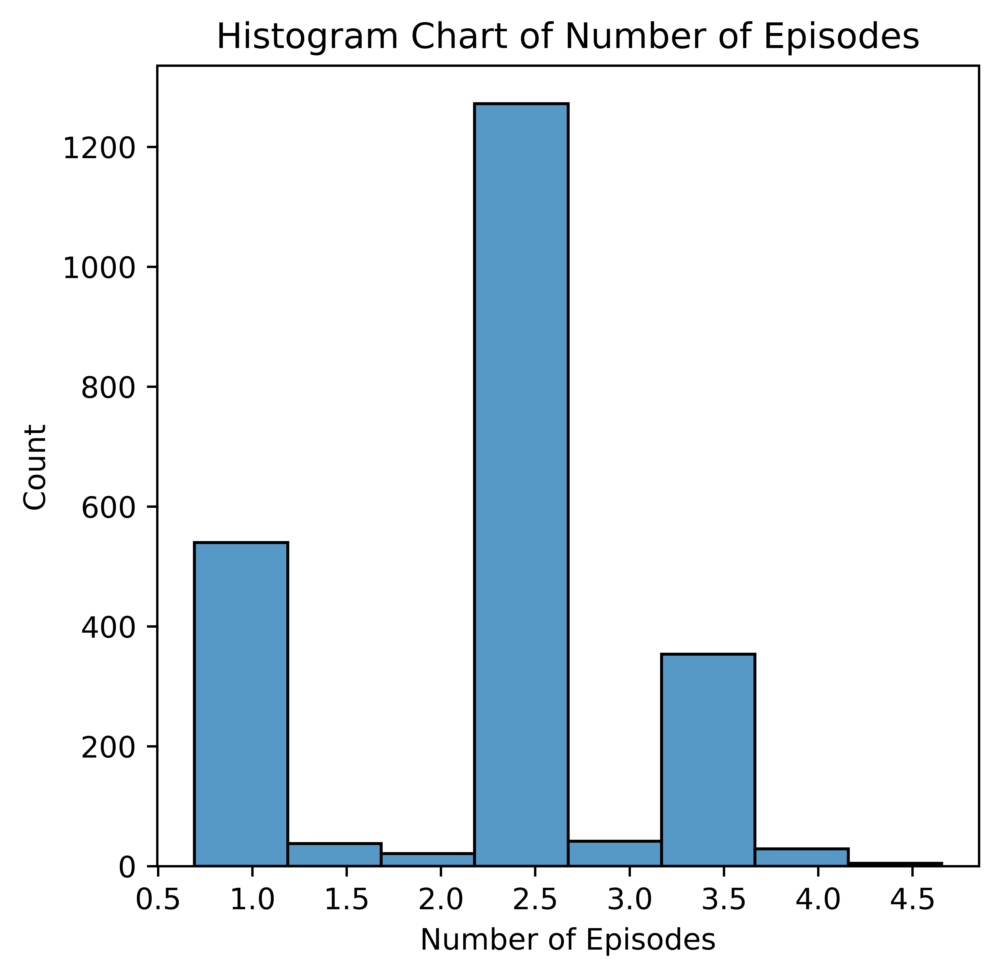

In [17]:
#Transform 'episode'
df_transform_check = pd.DataFrame(np.log(df_import['episodes']+1))

#check distribution

display(df_transform_check.describe())
quick_histogram(df_transform_check,'episodes',bins_=8, title='Number of Episodes')

#add to import_df
df_import.loc[:,'episodes_log'] = df_transform_check

**Key take away**

- The data with natural log transformation looks more normally distributed compared to the untransformed feature. This new feature may perform better later in the model creation portion of this project. 


Changes has been made and distribution is adequate. The following feature `duration` will be reviewed next. 

### Review Duration feature ###

The data under `duration` will be reviewed. Values and distribution will be reviewed.  

In [18]:
# Review value count
display(df_import['duration'].value_counts())

24 min. per ep.    734
23 min. per ep.    406
Unknown            170
23 min per ep      141
25 min. per ep.    123
                  ... 
1 hr. 58 min.        1
27 min.              1
6 min.               1
1 hr. 7 min.         1
27 min               1
Name: duration, Length: 224, dtype: int64

**Key take away**
- Data type is incorrectly noted as object.

- Duration is presented as a mixture of numeric value and associated units.

- Duration is required to be described as a numeric value and in minutes.

#### Check on how words are paired ####

The information is provided as string of time and unit. The data will be split by words to examine common words and patterns to simplify the information to a numeric value.

In [19]:
#change duration to only numeric 

#isolate the col and split words
duration_split = df_import['duration'].str.split(expand=True)

# print unique values at each split index
    #i is split index starting at 0 
i=0

#loop at each column index to get all unique values
for col in duration_split.columns:
    print(f'For column at index {i}:')
    print(duration_split[col].unique(),'\n')
    i+=1


For column at index 0:
['25' '23' '27' '24' '2' '21' '14' '12' '20' '26' '22' '30' '15' '13' '1'
 '55' '35' '16' '9' '45' '51' '48' '50' '32' '8' '37' '28' '29' '41' '5'
 '57' '11' '4' '18' '3' '10' '6' '43' '59' '7' '47' '38' '52' '46' '44'
 'Unknown' '58' '53' '17' '19' '42' '56' '34' '54' nan] 

For column at index 1:
['min.' 'hr.' None 'sec.' 'min' 'hr' nan] 

For column at index 2:
['per' '4' '10' '5' '33' '45' '57' None '35' '31' '34' '39' '49' '25' '6'
 '28' '15' '12' '32' '1' '20' '14' '21' '38' '48' '50' '40' '52' '55' '30'
 '47' '29' '36' '37' '41' '27' '53' '56' '59' '51' '54' '22' '42' '13'
 '11' '26' '3' '44' '17' '2' '43' '23' '18' '7' '58' '24' '46' '16' nan] 

For column at index 3:
['ep.' 'min.' None 'ep' 'min' nan] 

For column at index 4:
[None 'per' nan] 

For column at index 5:
[None 'ep.' nan] 



**Take away of the word sequence**

- For the first word: there is no unique non numeric value besides unknown and nan

- For the second word, min, hr, sec, and variation of the earlier are used. 

- For all text, first value provide number and second provides time unit. 

- For the third word, unique values are numeric values, per, none, and nan.

- For the fourth word, unique values are ep, min, none, and nan.

- For the fifth and last word, unique values are per, none, and nan.

Key words to decipher time value are min, hr and sec and typically numeric values are on the prior position/column where key word is present. 

An algorithm is required to:
- Look for key words (time units) starting at the last word or column from 'duration split' dataframe. 
- Transform adjacent numeric value (looking at the forward column) to minute.
- Store value.
- Look for additional key word moving right to left.
- Repeat transformation of numeric value and add value to stored value.  

In [20]:
#remove period in each column
for col in duration_split.columns:
    duration_split[col] = duration_split[col].str.replace('[^a-zA-Z0-9]+', '', regex=True)

In [21]:
#Key created for key words related to time
    #note as some unique key words has a period, using a Condition to check if element is in List is sufficent to use key words
        #without a period
    #updates many be required if other time units are used in a different dataset
    
words = {'min':1,'hr':60,'sec':1/60}


"""dataframe for duration in minutes ONLY"""


#Create dataframe with equivalent numer of rows of data and one column to store duration in mintute. 
    #Dataframe is zero filled
data = pd.DataFrame(np.zeros((duration_split.shape[0],1)))

#Working backwards from last column, the code will loop and drop last column untill ONLY 1 column is is left

while duration_split.shape[1]>1:

    #examine last column by name and index 
    column = duration_split.columns[-1]
    index = len(duration_split.columns)-1
    
    # chekc each word in the last column by key word
    for word in words.keys():
            
        #Create a dummy dataframe for each column iteration 
             ##Create dataframe with equivalent numer of rows of data and one column
        data_dummy = pd.DataFrame(np.zeros((duration_split.shape[0],1)))
            
        #Check if a key word is in column
        conditional = duration_split.iloc[:,index].str.contains(word, na=False)
            
        if conditional.sum() >0:
                
            #take numeric value on  column prior to key word
   
            ## dummy selected variable for numeric value 
            selected = duration_split[conditional].iloc[:,index-1]
            selected = pd.DataFrame(selected)
            
            ##Turn to float data type
            
            selected.iloc[:,0]=pd.to_numeric(selected.iloc[:,0],errors='coerce')
            
            ## modify value to mintues based on key
            modified = selected*words[word]
                
            #add to dummy dataframe and turn all null to 0
            data_dummy = pd.DataFrame(modified.iloc[:,0]+data_dummy.iloc[:,0])
            data_dummy=data_dummy.fillna(0)
                
            #add back to data
            data = data + data_dummy

        else:
            pass
            
    #Drop last column at end of loop 
    duration_split.drop(columns=column, inplace =True)
    print(f'{column} index column has been removed')




data = data.rename(columns={0:'duration_min'})

#check data using value counts
display(data.value_counts())

5 index column has been removed
4 index column has been removed
3 index column has been removed
2 index column has been removed
1 index column has been removed


duration_min
24.0            814
23.0            553
0.0             183
25.0            134
22.0             52
               ... 
41.0              1
78.0              1
35.0              1
34.0              1
162.0             1
Length: 130, dtype: int64

The data for feature `duration` has been corrected to a single numeric value per cell.

**Combine corrected `duration` with 'df_import'**

The `duration_min` will be added to the dataframe using the existing indexes as a match. 

The `duration` feature will be removed after the data was concatenated. 

In [22]:
# concat data and remove duration
df_import= pd.concat([df_import,data], axis=1)

In [23]:
#drop duration
df_import = df_import.drop(columns = 'duration')

In [24]:
#check 
df_import.head()

,title,type,source,episodes,rating,related,producer,licensor,studio,genre,aired_start,aired_end,revenue,2_synopsis,3_synopsis,Animation Studio,Publisher,Distributor,episodes_log,duration_min
0,witch hunter robin,TV,Original,26.0,PG-13 - Teens 13 or older,[],Bandai Visual,"Funimation, Bandai Entertainment",Sunrise,"Action, Magic, Police, Supernatural, Drama, My...",2002-07-02 00:00:00,2002-12-24 00:00:00,1186650.0,Witches are individuals with special powers li...,Witches are individuals with special powers li...,Sunrise,Bandai Visual,Bandai Visual,3.295837,25.0
1,hachimitsu to clover,TV,Manga,24.0,PG-13 - Teens 13 or older,"{'Adaptation': [{'mal_id': 1009, 'type': 'mang...","Genco, Fuji TV, Shueisha",Viz Media,J.C.Staff,"Comedy, Drama, Josei, Romance, Slice of Life",2005-04-15 00:00:00,2005-09-27 00:00:00,3431025.0,"Yuuta Takemoto, a sophomore at an arts college...","Yuuta Takemoto, a sophomore at an arts college...",JC Staff,Asmik Ace,Kadokawa,3.218876,23.0
2,initial d fourth stage,TV,Manga,24.0,PG-13 - Teens 13 or older,"{'Adaptation': [{'mal_id': 375, 'type': 'manga...","OB Planning, Studio Jack",Funimation,A.C.G.T.,"Action, Cars, Sports, Drama, Seinen",2004-04-17 00:00:00,2006-02-18 00:00:00,13730025.0,Takumi Fujiwara finally joins Ryousuke and Kei...,Takumi Fujiwara finally joins Ryousuke and Kei...,A.C.G.T.,Avex,Avex,3.218876,27.0
3,ring ni kakero 1,TV,Manga,12.0,PG - Children,"{'Adaptation': [{'mal_id': 14231, 'type': 'man...",NaN,NaN,Toei Animation,"Action, Shounen, Sports",2004-10-06 00:00:00,2004-12-15 00:00:00,253875.0,"In order to fulfill their dead father's wish, ...","In order to fulfill their dead father's wish, ...",Toei Animation,Avex,Avex,2.564949,25.0
4,school rumble,TV,Manga,26.0,PG-13 - Teens 13 or older,"{'Adaptation': [{'mal_id': 160, 'type': 'manga...","TV Tokyo, Sotsu, Marvelous, Starchild Records,...",Funimation,Studio Comet,"Comedy, Romance, School, Shounen",2004-10-05 00:00:00,2005-03-29 00:00:00,2986650.0,"Just the words ""I love you,"" and everything ch...","Just the words ""I love you,"" and everything ch...",Studio Comet,Marvelous AQL,Media Factory,3.295837,23.0


#### Check distribution of duration

Statistical data of duration:


count    2404.000000
mean       30.789497
std        28.284275
min         0.000000
25%        23.000000
50%        24.000000
75%        24.000000
max       162.000000
Name: duration_min, dtype: float64

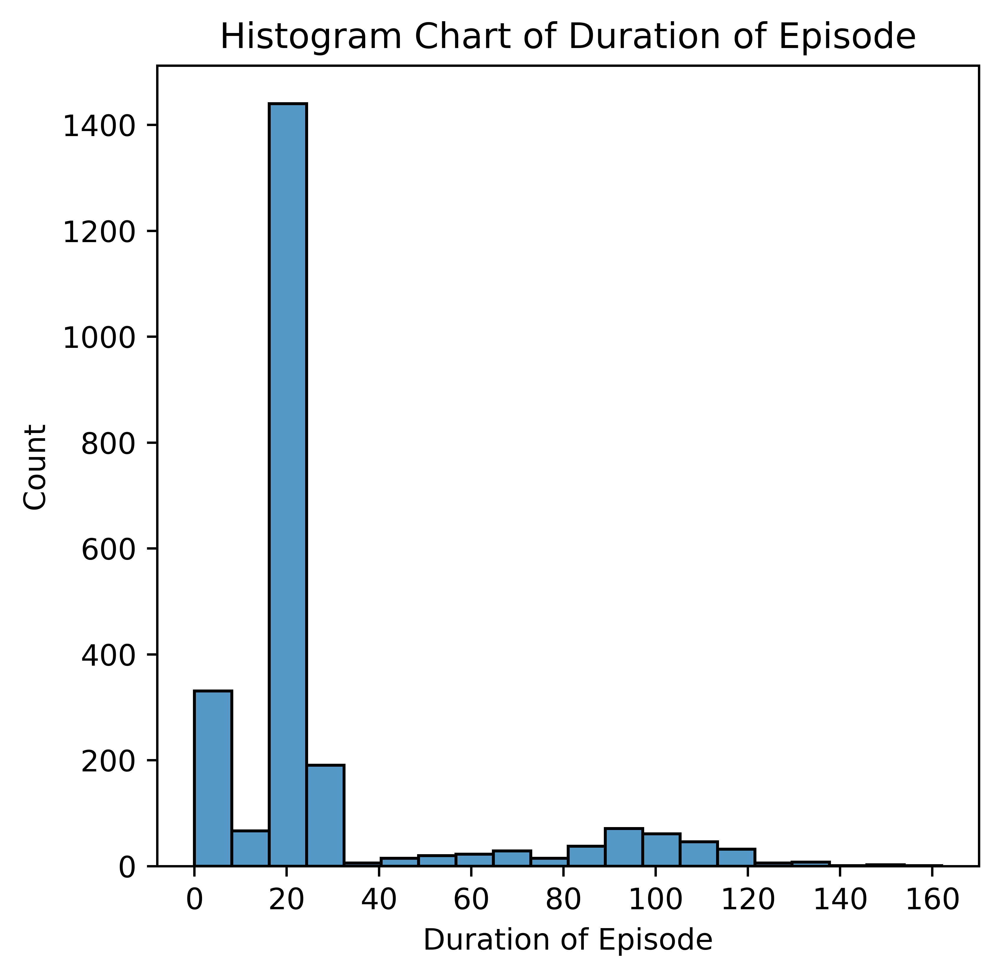

In [25]:
# Review distribution of the episode data
print('Statistical data of duration:')
display(df_import['duration_min'].describe())
quick_histogram(df_import,'duration_min',bins_=20, title='Duration of Episode')

**Key take away**
- Data type is correctly noted as float.

- Distribution heavily distributed at 20-25. 

- Noted median is 24 minutes

- Distribution is right skewed. This is likely due to high number of TV shows. Transformation of the data using the natural logarithm (log) will help to normalize the data.  

- Varies values are logged as 0. This is not correct. Values will be noted as null and corrected latter on.

#### Change 0 values to null

In [26]:
#Condition
condition_duration_0 = df_import['duration_min']==0
df_import.loc[condition_duration_0,'duration_min'] = np.nan

**Create a natural logarithm of `duration_min`**

The `duration_min` feature will be transformed using the *np.log(x+1)* method and both original and transformed features will be kept.

,duration_min
count,2221.000000
mean,3.286339
std,0.717100
min,0.223144
25%,3.178054
50%,3.218876
75%,3.258097
max,5.093750


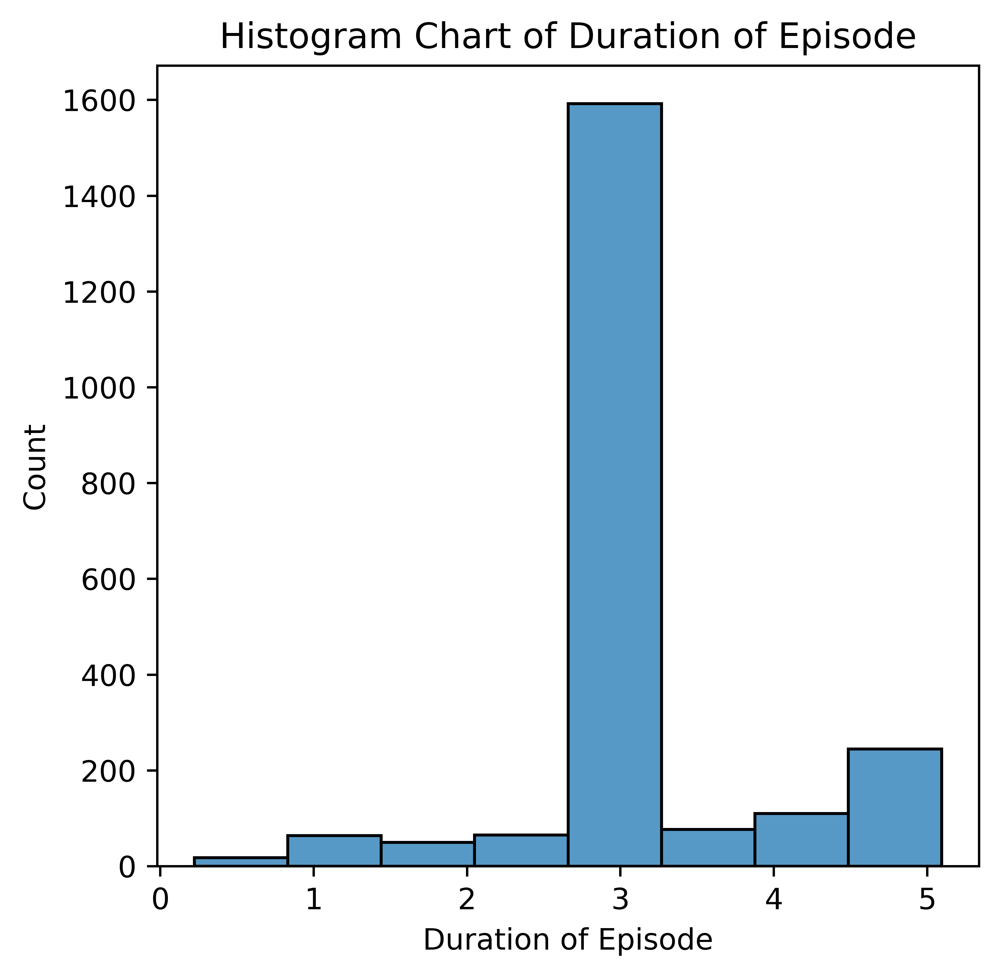

In [27]:
#Transform 'episode'
df_transform_check = pd.DataFrame(np.log(df_import['duration_min']+1))

#check distribution

display(df_transform_check.describe())
quick_histogram(df_transform_check,'duration_min',bins_=8, title='Duration of Episode')

#add to import_df
df_import.loc[:,'duration_min_log'] = df_transform_check

**Key take away**

- The data with natural log transformation looks more normally distributed compared to the untransformed feature. This new feature may perform better later in the model creation portion of this project. 


Changes has been made and distribution is adequate. The following feature `Rating` will be reviewed next. 

### Review Rating feature ###

The data under `Rating` will be reviewed. Values and distribution will be reviewed.  

PG-13 - Teens 13 or older         1445
R - 17+ (violence & profanity)     356
R+ - Mild Nudity                   202
G - All Ages                       153
None                               120
PG - Children                      111
Rx - Hentai                          4
Name: rating, dtype: int64

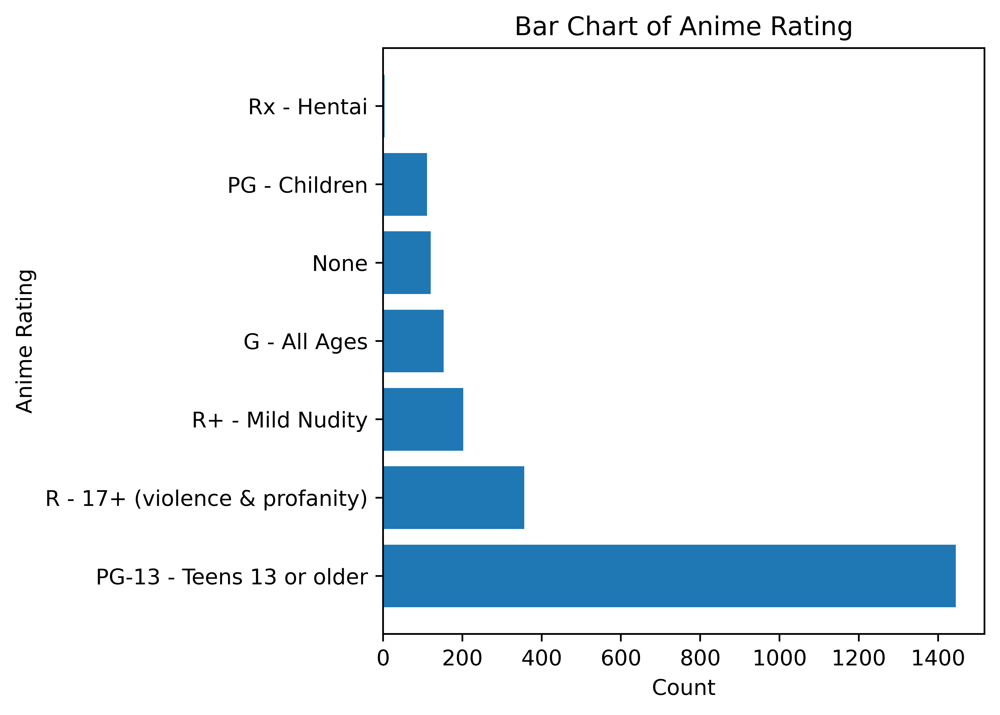

In [28]:
# Review value count and plot distribtuion 
display(df_import['rating'].value_counts())
(quick_bar(df_import,'rating', 'Anime Rating'))
 

For `rating`, the following values are possible: 
- R rating
- PG-13 - Teens 13 or older       
- R - 17+ (violence & profanity)     
- R+ - Mild Nudity                   
- G - All Ages                       
- None                               
- PG - Children                      

**Key take away**
- Data type is correctly noted as object.

- Distribution is in favor of PG-13 - Teens 13 or older. To decrease distribution, common rating shall be grouped to improve distribution. 

- R ratings will be grouped together

- G and PG ratings will be group together as G - All Ages

- Rating labeled None will be renamed to Unknown

In [29]:
#Combine R Rating 
df_import.loc[((df_import['rating']=='R - 17+ (violence & profanity)')|(df_import['rating']=='Rx - Hentai')|\
               (df_import['rating']=='R+ - Mild Nudity')),'rating'] = 'R rating'

#None is relabeled as Unknown
df_import.loc[((df_import['rating']=='None')),'rating'] = 'Unknown' 

#Combine PG and G rating

df_import.loc[((df_import['rating']=='PG - Children')),'rating'] = 'G - All Ages' 

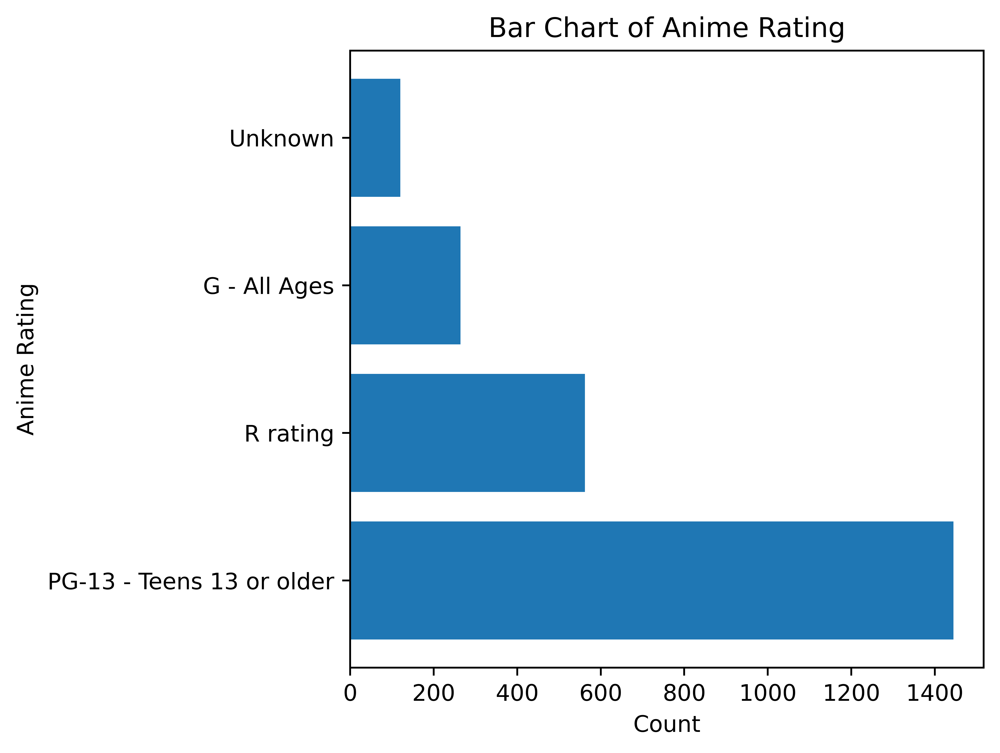

In [30]:
(quick_bar(df_import,'rating', 'Anime Rating'))

Changes have been made and distribution is adequate. The following feature `related` will be reviewed next. 

### Review Related feature ###

The data under `related` will be reviewed. Per previous note, the data contains dictionaries. These data will be expanded to further examine how these feature can be used. 

In [31]:
#Examine one cell for 'related' feature
df_import.loc[1,'related']

"{'Adaptation': [{'mal_id': 1009, 'type': 'manga', 'url': 'https://myanimelist.net/manga/1009/Hachimitsu_to_Clover', 'title': 'Hachimitsu to Clover'}], 'Side story': [{'mal_id': 644, 'type': 'anime', 'url': 'https://myanimelist.net/anime/644/Hachimitsu_to_Clover_Specials', 'title': 'Hachimitsu to Clover Specials'}], 'Sequel': [{'mal_id': 1142, 'type': 'anime', 'url': 'https://myanimelist.net/anime/1142/Hachimitsu_to_Clover_II', 'title': 'Hachimitsu to Clover II'}]}"

**Take away**

- The dictionary contains information about related animes.
- The key describes how the anime per data entry is related to other anime listed in the dictionary.
- The values provide an ID, source type, URL and name of the related anime. 

The information in the dictionary values are unique to the dataset and will not help make the data interpretable. However, the dictionary key is a common descriptor. This may help add value to the data. 

Further exploration of the dictionary key is needed.

In [32]:
#Create a new column to hold key values as a list

#Create an empty column called 'related_keys'
col_index = df_import.shape[1]
df_import.insert(loc=col_index,column='related_keys',value='0')

In [33]:
#Determine all unique key values in the data set and add key value to empty column  'related_key'

#empty set for keys 
set_keys = set({})

#Fill na value to avoid issue with methods to follow
df_import['related'].fillna('0',inplace = True)

# Loop through each row
for i in range(0,df_import.shape[0]):
    
    #get cell value under related column
    text = df_import.iloc[i,:]['related']

    
    #check if dictionary holds any information based on length of text  
    length_related = len(text)
    if length_related >3:
    
        #turn string to dictionary 
        dict_ =  ast.literal_eval(text)
        
        # get key values and add to set list 
        set_keys=set_keys.union(set(dict_.keys()))
        
        #Add key values as string to 'realted_key'
        df_import.iloc[i,col_index] = str(list(dict_.keys()))
    else:
        pass
#evalaute set_keys    
set_keys

{'Adaptation',
 'Alternative setting',
 'Alternative version',
 'Character',
 'Full story',
 'Other',
 'Parent story',
 'Prequel',
 'Sequel',
 'Side story',
 'Spin-off',
 'Summary'}

The dictionary key contains the following information: 

- 'Adaptation': Adaptation of original anime and source.

- 'Alternative setting': Related anime with similar world/timeline but different characters or same character in different universe . 

- 'Alternative version':Related anime that has the  same setting, same character and story is told differently.  

- 'Character': Character from another source/ anime makes a cameo.   

- 'Full story': Full version of the summarized story.

- 'Other': Can be a intro that is unrelated to the plot. Should be paired with side story. 

- 'Parent story' 

- 'Prequel' 

- 'Sequel'

- 'Side story': Takes place sometime during the parent storyline.

- 'Spin-off': has related anime for which the story is based on the show setting. 

- 'Summary': Has a anime that summarizes the show.

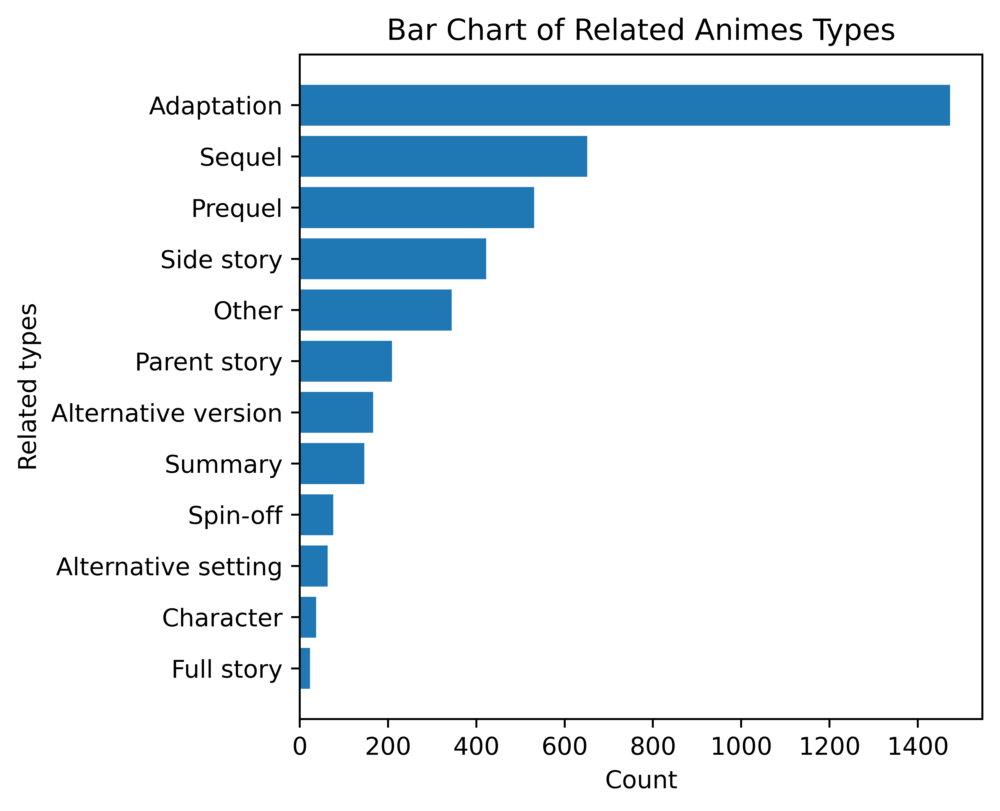

In [34]:
#plot frequency 

#determine the frequency of the key 
a={}
for key in set_keys:
    a[key] = 0

for i, row in df_import.iterrows():
    
    related_key_list= ((ast.literal_eval(row['related_keys'])))
    
    if type(related_key_list) == list:
        for x in ast.literal_eval(row['related_keys']):
            a[x] +=1
    else:
        pass

#Create plot
    #sort values
a= dict(sorted(a.items(), key=lambda item: item[1]))
plt. figure(figsize=(5,5),dpi=720)
plt.barh(list(a.keys()),list(a.values()))
plt.title(f'Bar Chart of Related Animes Types')
plt.xlabel('Count')
plt.ylabel('Related types');

**Key take away**

- New feature called `Related_Key` was created to hold a list describes how another anime is related to another anime

- `Related_key` is kept as an object. 

- Distribution is in adaptation and sequel. To decrease distribution, common rating shall be grouped to improve distribution. 

- All other related type with counts less than Other will be grouped with other

In [35]:
change_key_list = {'Parent story', 'Alternative version', 'Spin-off','Summary','Alternative setting','Character','Full story'}

#Change value that appear in change key list to other 
    # Apply to column related keys 
    
#iterate through each row
for i, row in df_import.iterrows():
    
    #turn string to list
    related_key_list= ((ast.literal_eval(row['related_keys'])))

    if type(related_key_list) == list:
        
      
        #loop through each item in list (of 1 cell) and get item position
        for index_key, key in enumerate(ast.literal_eval(row['related_keys'])):
   
            #if item is in change key list than change word to other
            if key in change_key_list:
                  related_key_list[index_key] =  'Other'
                
        # Turn to set to remove repeated and back to list
        related_key_list = list(set(related_key_list))
     
        
    else:
        pass
    #Revise df_import dataframe on realted_key
    df_import.iloc[i,-1] = str(related_key_list)
   

**Create Dummy variables for related keys**

In [36]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_related = df_import[['related_keys']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_related['related_keys'] = df_related['related_keys'].str.lower()
df_related['related_keys'] = df_related['related_keys'].str.replace('[^a-zA-Z0-9,\'\"]+', '', regex=True)
                                        
df_related = pd.DataFrame(df_related['related_keys'].str.split(','))

    #use get dummy 
df_related= df_related['related_keys'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_related_sum = df_related.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_related.head(3))

print('\nValue count of all features: ')
display(df_related_sum)

#Drop last variable
df_related.drop(columns = ['0'],inplace=True)
df_related=df_related.add_prefix('related_')

Dataframe of dummy variable: 


,'adaptation','other','prequel','sequel','sidestory',0
0,0,0,0,0,0,1
1,1,0,0,1,1,0
2,1,1,1,1,1,0



Value count of all features: 


'sidestory'      422
0                482
'prequel'        531
'sequel'         651
'other'          843
'adaptation'    1473
dtype: int64

**Plot the revised related key**

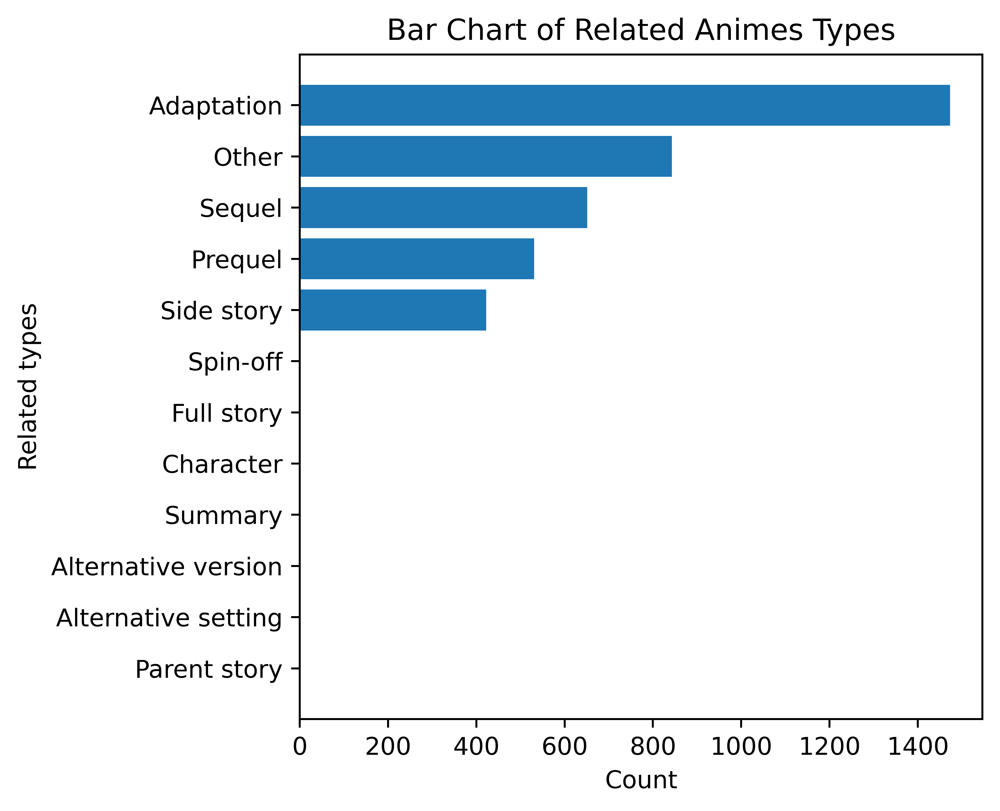

In [37]:
#plot frequency 

#determine the frequency of the key 
a={}
for key in set_keys:
    a[key] = 0

for i, row in df_import.iterrows():
    
    related_key_list= ((ast.literal_eval(row['related_keys'])))
    
    if type(related_key_list) == list:
        for x in ast.literal_eval(row['related_keys']):
            a[x] +=1
    else:
        pass

#Create plot
    #sort values
a= dict(sorted(a.items(), key=lambda item: item[1]))
plt. figure(figsize=(5,5),dpi=720)
plt.barh(list(a.keys()),list(a.values()))
plt.title(f'Bar Chart of Related Animes Types')
plt.xlabel('Count')
plt.ylabel('Related types');

Changes has been made and distribution is adequate. `Related` feature will be dropped.  

In [38]:
# Drop related feature
df_import.drop(columns='related',inplace=True)

The following feature `producer` will be reviewed. 

### Review Producer feature ###

The data under `producer` will be reviewed. Unique values and the distribution of the data will be reviewed. 

In [39]:
df_import['producer'].value_counts()

TV Asahi                                                                     21
Aniplex                                                                      18
Starchild Records                                                            18
Bandai Visual                                                                14
TV Asahi, Asatsu DK                                                          11
                                                                             ..
Avex Entertainment, Pony Canyon                                               1
Genco, Lantis, Media Factory, Movic, Hobby Japan, Showgate, Gigno Systems     1
Lantis, Media Factory, AT-X                                                   1
TV Tokyo, Kadokawa Shoten, KlockWorx, Memory-Tech, NTT Docomo                 1
Infinite                                                                      1
Name: producer, Length: 1238, dtype: int64

The data contains more than 1000 unique values and cell values may contain more than 1 producer. 

The data will be split  by 'comma'.

In [40]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_producer = df_import[['producer']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_producer['producer'] = df_producer['producer'].str.lower()
df_producer['producer'] = df_producer['producer'].str.replace('[^a-zA-Z0-9\[\],\'\"]+', '', regex=True)
                                        
df_producer = pd.DataFrame(df_producer['producer'].str.split(','))

    #use get dummy 
df_producer= df_producer['producer'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_producer_sum = df_producer.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_producer.head(3))

print('\nValue count of all features: ')
display(df_producer_sum)

Dataframe of dummy variable: 


,1stplace,3xcube,501stjointfighterwing,5pb,81produce,abcanimation,accreate,actas,adores,age,...,yomiuriadvertising,yomiurishimbun,yomiuritelecasting,yomiuritventerprise,yoshimotocreativeagency,ytv,yuhodo,yumetacompany,zackpromotion,zeroa
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



Value count of all features: 


1stplace            1
studiopastoral      1
gentoshacomics      1
studionoix          1
gingaya             1
                 ... 
movic             133
klockworx         137
atx               151
lantis            205
aniplex           220
Length: 528, dtype: int64

After cleaning and creating dummy variables, there are 530 unique values and range of repeated use varies greatly. The information will plotted for the first 50 producers with a dashed line at 40 count. 

In [41]:
#plot of df_producer_sum

plt.figure(figsize = (10,20),dpi =720)
plt.title('Frequency of Producer',fontsize=20)
plt.xlabel('Count',fontsize = 14)
plt.ylabel('Producer Names',fontsize = 14)
plt.axvline(40, color = 'black',linestyle='dashed')
plt.barh(df_producer_sum.index[-50:],df_producer_sum.values[-50:]);

Given the the size of the potential dummy variables, the following action will be taken:
- Remove producers that appear less than 25.
- If no producer is listed, producer can be assumed to be taken as someone not part of the noted dummy variables.

In [42]:
# Total values 
print(f'Total values are {df_producer_sum.sum()}')

#drop unneed data where total count is less than 25 
print(f'Total values drops are {df_producer_sum[df_producer_sum<25].sum()}')
col_drop = df_producer_sum[df_producer_sum<25].index

df_producer.drop(columns = col_drop, inplace = True)
df_producer=df_producer.add_prefix('producer_')

#Total producers left
print(f'Total producers left are {len(df_producer.columns)}')


Total values are 5800
Total values drops are 2048
Total producers left are 57


After removing producer that appear less than 25 times, the total number of producer is 61. From 500, this value is acceptable.

Changes have been made and distribution is adequate. The following feature `Licensor` will be reviewed next. 

### Review Licensor feature ###

The data under `Licensor` will be reviewed for unique values and the distribution of the data will be reviewed. 

In [43]:
df_import['licensor'].value_counts()

Funimation                                                 376
Sentai Filmworks                                           328
Aniplex of America                                          81
NIS America, Inc.                                           37
Viz Media                                                   36
                                                          ... 
Viz Media, Media Blasters                                    1
Viz Media, Sentai Filmworks                                  1
Nozomi Entertainment, Discotek Media                         1
Bandai Entertainment, Discotek Media, Bandai Visual USA      1
Funimation, Kadokawa Pictures USA                            1
Name: licensor, Length: 82, dtype: int64

The data contains more than 85 unique values and cell values may contain more than 1 licensor. 

The data will be split by 'comma'.

In [44]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_licensor = df_import[['licensor']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_licensor['licensor'] = df_licensor['licensor'].str.lower()
df_licensor['licensor'] = df_licensor['licensor'].str.replace('[^a-zA-Z0-9\[\],\'\"]+', '', regex=True)
                                        
df_licensor = pd.DataFrame(df_licensor['licensor'].str.split(','))

    #use get dummy 
df_licensor= df_licensor['licensor'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_licensor_sum = df_licensor.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_licensor.head(3))

print('\nValue count of all features: ')
display(df_licensor_sum)

Dataframe of dummy variable: 


,4kidsentertainment,advfilms,aniplexofamerica,bandai,bandaientertainment,bandaivisualusa,centralparkmedia,crimsonstarmedia,crunchyroll,dentsuentertainmentusa,...,ponycanusa,sentaifilmworks,shoutfactory,sonypicturesentertainment,supertechnoarts,thepokemoncompanyinternational,tokyopop,vizmedia,waltdisneystudios,warnerbros
0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



Value count of all features: 


supertechnoarts                     1
bandai                              1
crimsonstarmedia                    1
dentsuentertainmentusa              1
piedpiper                           1
flatironfilmcompany                 1
geneonuniversalentertainment        1
sonypicturesentertainment           2
mangaentertainment                  2
tokyopop                            3
warnerbros                          4
bandaivisualusa                     4
miramaxfilms                        4
centralparkmedia                    5
shoutfactory                        5
maidenjapan                         8
kadokawapicturesusa                 8
4kidsentertainment                  9
thepokemoncompanyinternational     10
waltdisneystudios                  10
ponycanusa                         13
nyavpost                           15
gkids                              16
crunchyroll                        23
discotekmedia                      34
nozomientertainment                36
nisamerica  

After cleaning and creating dummy variables, there are 37 unique values and thr range of repeated use varies greatly. The information will be plotted for the licensors with a dashed line at 25 count. 

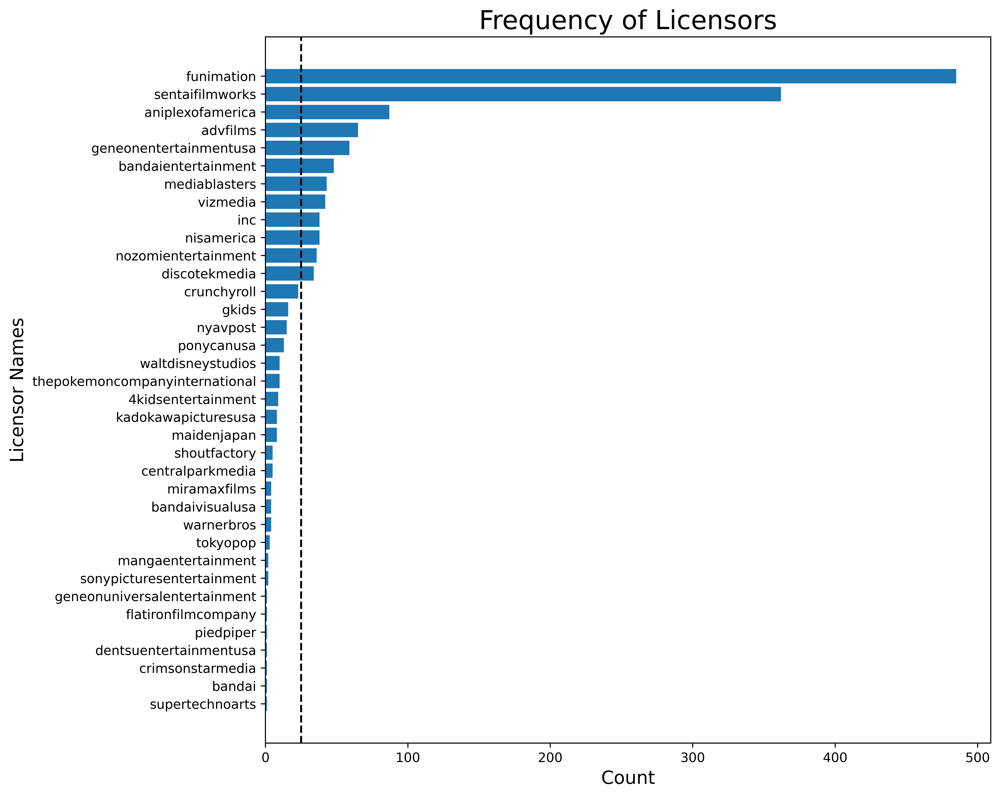

In [45]:
#plot of df_licensor_sum

plt.figure(figsize = (10,10),dpi =720)
plt.title('Frequency of Licensors',fontsize=20)
plt.xlabel('Count',fontsize = 14)
plt.ylabel('Licensor Names',fontsize = 14)
plt.axvline(25, color = 'black',linestyle='dashed')
plt.barh(df_licensor_sum.index,df_licensor_sum.values);

Given the the size of the potential dummy variables, the following action will be taken:
- Remove licensor that appear less than 25 
- If no licensor is listed, licensor can be assumed to be not part of the listed dummy variables. 

In [46]:
# Total values 
print(f'Total values are {df_licensor_sum.sum()}')

#drop unneed data where total count is less than 25 
print(f'Total values drops are {df_licensor_sum[df_licensor_sum<25].sum()}')
col_drop = df_licensor_sum[df_licensor_sum<25].index

df_licensor.drop(columns = col_drop, inplace = True)
df_licensor=df_licensor.add_prefix('licensor_')

#Total producers left
print(f'Total licensors left are {len(df_licensor.columns)}')


Total values are 1485
Total values drops are 148
Total licensors left are 12


After removing licensors that appear less than 25 times, the total number of licensor is 13. From 80, this value is acceptable.

Changes has been made and distribution is adequate. The following feature `studio` will be reviewed next. 

### Review Studio feature ###

The data under `Studio` will be reviewed for unique values and the distribution of the data will be reviewed. 

In [47]:
df_import['studio'].value_counts()

J.C.Staff           123
Studio Deen          91
A-1 Pictures         89
Toei Animation       86
Madhouse             74
                   ... 
Tomovies              1
Xebec Zwei            1
Karaku                1
ixtl, LIDENFILMS      1
OLM|P.I.C.S.          1
Name: studio, Length: 337, dtype: int64

The data contains more than 347 unique values and cell values may contain more than 1 Studio. 

The data will be split by 'comma'.

In [48]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_studio = df_import[['studio']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_studio['studio'] = df_studio['studio'].str.lower()
df_studio['studio'] = df_studio['studio'].str.replace('[^a-zA-Z0-9\[\],\'\"]+', '', regex=True)
                                        
df_studio = pd.DataFrame(df_studio['studio'].str.split(','))

    #use get dummy 
df_studio= df_studio['studio'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_studio_sum = df_studio.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_studio.head(3))

print('\nValue count of all features: ')
display(df_studio_sum)

Dataframe of dummy variable: 


,3xcube,8bit,a1pictures,accaeffegigaproduction,acgt,actas,aic,aicasta,aicbuild,aicclassic,...,wtoonstudiodmmfutureworks,xebec,xebeczwei,yokohamaanimationlab,yostarpicturescandybox,yumetacompany,yumetacompanygraphinica,yumetacompanygraphinicaflagshipline,zerog,zexcs
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



Value count of all features: 


3xcube               1
gainaxkyoto          1
pra                  1
gaina                1
fukushimagainax      1
                  ... 
madhouse            80
toeianimation       86
studiodeen          92
a1pictures          96
jcstaff            132
Length: 253, dtype: int64

After cleaning and creating dummy variables, there are 262 unique values and the range of repeated use varies greatly. The information will be plotted for the first 50 studios with dashed line at 25 count. 

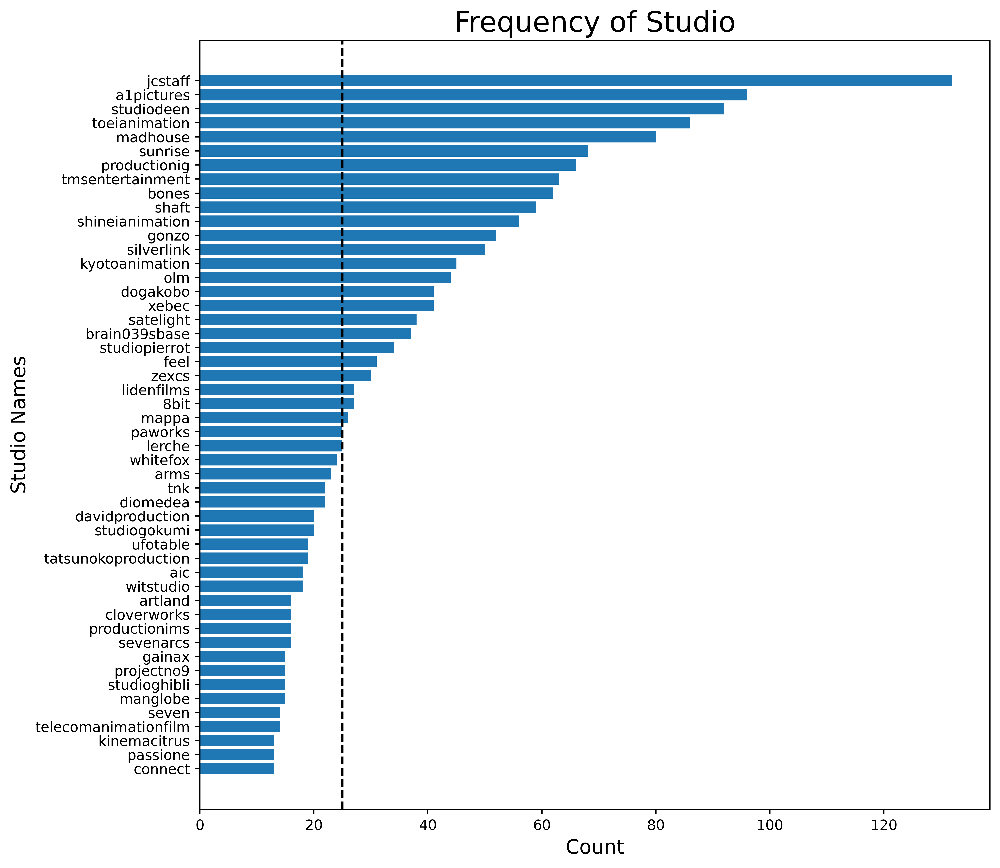

In [49]:
#plot of df_studio_sum

plt.figure(figsize = (10,10),dpi =720)
plt.title('Frequency of Studio',fontsize=20)
plt.xlabel('Count',fontsize = 14)
plt.ylabel('Studio Names',fontsize = 14)
plt.axvline(25, color = 'black',linestyle='dashed')
plt.barh(df_studio_sum.index[-50:],df_studio_sum.values[-50:]);

Given the the size of the potential dummy variables, the following action will be taken:
- Remove studio that appear less than 25 
- If no studio is listed, studio can be assumed not to be part of the dummy variables. 

In the following section, `studio` and `Animation Studio` will be combined. The action to reduce unique variable will be taken after both features have been combined.

After removing studio that appear less than 25 times, the total number of studio is 30. From 250, this value is acceptable.

### Review Genre feature ###

The data under `Genre` will be reviewed for unique values and the distribution of the data will be reviewed. 

In [50]:
df_import['genre'].value_counts()

Music                                                      26
Slice of Life, Comedy                                      20
Slice of Life, Comedy, School                              16
Slice of Life, Comedy, School, Seinen                      16
Comedy                                                     13
                                                           ..
Thriller, Sci-Fi                                            1
Sci-Fi, Harem, Comedy, Ecchi, School, Shounen               1
Action, Drama, Historical, Josei, Samurai, Supernatural     1
Adventure, Music                                            1
Historical                                                  1
Name: genre, Length: 1596, dtype: int64

The data contains more than 1636 unique values and cell values may contain more than 1 genre. 

The data will be split by 'comma'.

In [51]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_genre = df_import[['genre']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_genre['genre'] = df_genre['genre'].str.lower()
 

df_genre['genre'] = df_genre['genre'].str.replace('[^a-zA-Z0-9\[\],\'\"|]+', '', regex=True)

    #Replace '\' if present to comma 
df_genre['genre'] = df_genre['genre'].str.replace('[|]', ',', regex=True)
                      
 
df_genre = pd.DataFrame(df_genre['genre'].str.split(','))

    #use get dummy 
df_genre= df_genre['genre'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_genre_sum = df_genre.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_genre.head(3))

print('\nValue count of all features: ')
display(df_genre_sum)

Dataframe of dummy variable: 


,action,adventure,avantgarde,boyslove,cars,comedy,dementia,demons,drama,ecchi,...,shounen,shounenai,sliceoflife,space,sports,supernatural,superpower,suspense,thriller,vampire
0,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
2,1,0,0,0,1,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0



Value count of all features: 


erotica             1
girlslove           2
avantgarde          2
dementia            3
gourmet             3
boyslove            4
hentai              5
cars                6
suspense           11
shounenai          19
shoujoai           29
thriller           32
josei              38
samurai            45
vampire            48
police             51
martialarts        53
space              54
horror             58
game               65
parody             82
kids               86
demons             89
psychological     102
sports            111
military          128
shoujo            130
music             137
mecha             145
historical        156
superpower        164
harem             181
magic             210
mystery           223
seinen            258
ecchi             265
adventure         411
supernatural      432
scifi             443
sliceoflife       447
shounen           452
school            559
romance           579
drama             591
fantasy           649
action    

After cleaning and creating dummy variables, there are 47 unique values and range of repeated use varies greatly. The information will plotted with a dashed line at 25 count. 

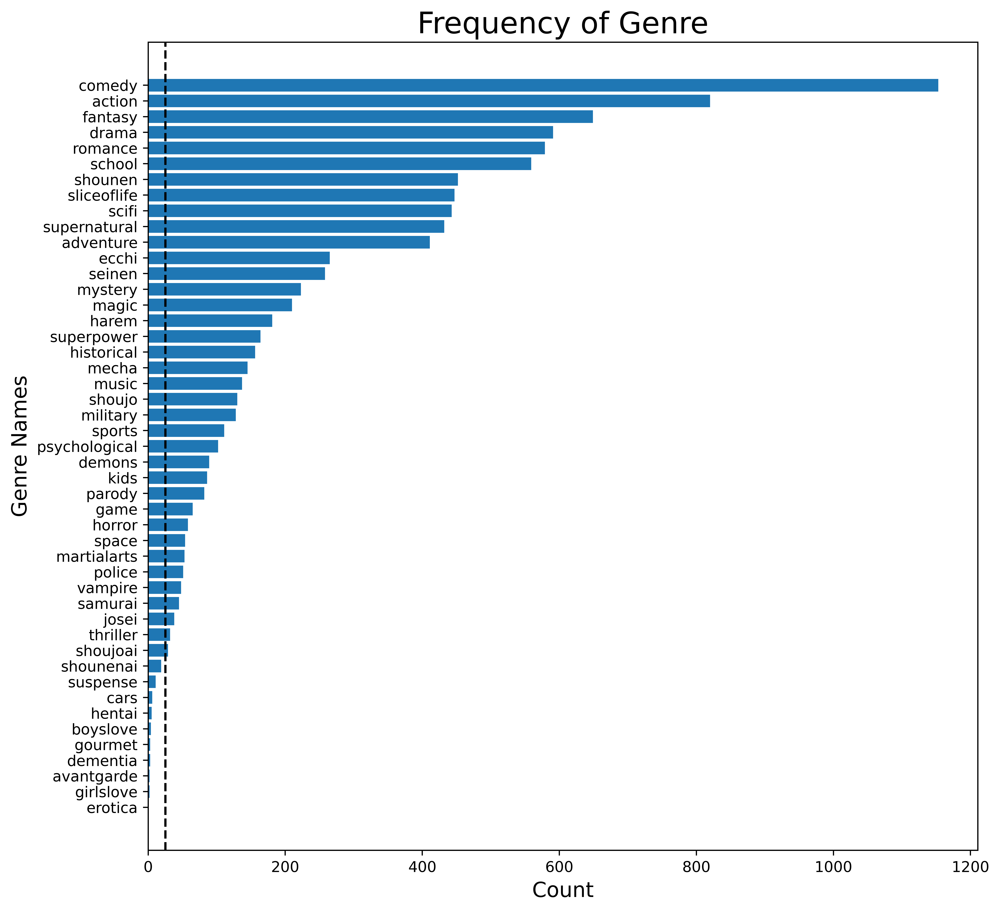

In [52]:
#plot of df_genre_sum

plt.figure(figsize = (10,10),dpi =720)
plt.title('Frequency of Genre',fontsize=20)
plt.xlabel('Count',fontsize = 14)
plt.ylabel('Genre Names',fontsize = 14)
plt.axvline(25, color = 'black',linestyle='dashed')
plt.barh(df_genre_sum.index,df_genre_sum.values);

Given the the size of the potential dummy variables, the following action will be taken:
- Remove genre that appear less than 25 
- If no genre is listed, Genre can be assumed not be a part of the dummy variables. 

In [53]:
# Total values 
print(f'Total values are {df_genre_sum.sum()}')

#drop unneed data where total count is less than 25 
print(f'Total values drops are {df_genre_sum[df_genre_sum<25].sum()}')
col_drop = df_genre_sum[df_genre_sum<25].index

df_genre.drop(columns = col_drop, inplace = True)
df_genre=df_genre.add_prefix('genre_')

#Total producers left
print(f'Total licensors left are {len(df_genre.columns)}')


Total values are 9532
Total values drops are 56
Total licensors left are 37


After removing genre that appear less than 25 times, the total number of genre is 38. From 47, this value is acceptable.

The following feature `aired_start` and `aired_ended` will be reviewed next. 

### Review Aired features ###

The data under `aired_start` and `aired_ended` will be reviewed for unique values and the distribution of the data will be reviewed. 

In [54]:
#Check the first 5 rows 
print('The first five rows are:')
display(df_import[['aired_start','aired_end']].head(5))

#Check the info
print('\nThe dataframe info: \n')
display(df_import[['aired_start','aired_end']].info())

The first five rows are:


,aired_start,aired_end
0,2002-07-02 00:00:00,2002-12-24 00:00:00
1,2005-04-15 00:00:00,2005-09-27 00:00:00
2,2004-04-17 00:00:00,2006-02-18 00:00:00
3,2004-10-06 00:00:00,2004-12-15 00:00:00
4,2004-10-05 00:00:00,2005-03-29 00:00:00



The dataframe info: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2404 entries, 0 to 2403
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   aired_start  2402 non-null   object
 1   aired_end    2386 non-null   object
dtypes: object(2)
memory usage: 37.7+ KB


None

The data for the features above appears to be in a datatime format. However, data needs to be revised to match per data type.

In [55]:
#change datatype
df_import['aired_start'] = pd.to_datetime(df_import['aired_start'],utc=True)
df_import['aired_end'] = pd.to_datetime(df_import['aired_end'],utc=True)

The data will be separated to month and year to produce a distribution chart. 

In [56]:
#Create year and month for aired start and aired end
#aired_start 
df_import.loc[:,'aired_start_month']=df_import['aired_start'].dt.month
df_import.loc[:,'aired_start_year']=df_import['aired_start'].dt.year

#aired_end 
df_import.loc[:,'aired_end_month']=df_import['aired_end'].dt.month
df_import.loc[:,'aired_end_year']=df_import['aired_end'].dt.year

Plot the data per year and Month



In [57]:
df_import['aired_start_month'].value_counts()

4.0     529
10.0    519
7.0     466
1.0     415
3.0     120
12.0     67
9.0      54
2.0      54
8.0      52
6.0      43
11.0     42
5.0      41
Name: aired_start_month, dtype: int64

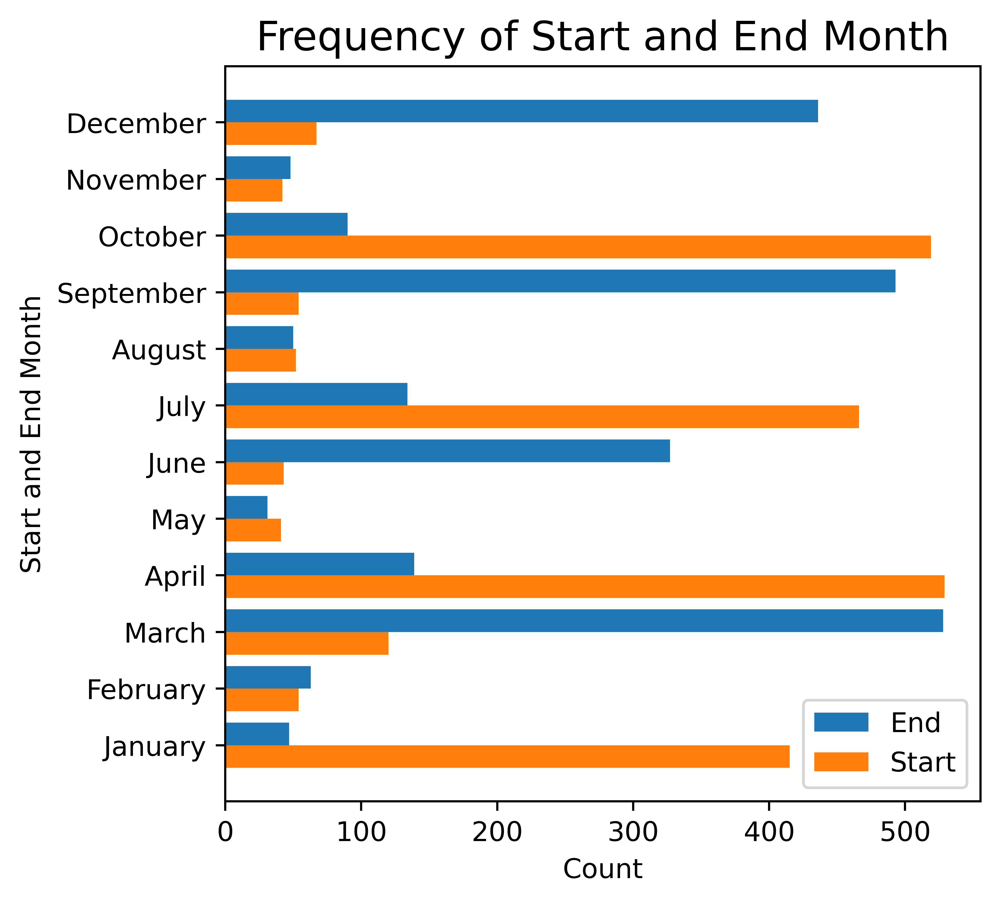

In [58]:
#plot frequency of start and end month

ind = np.arange(1,12+1)
width_ = 0.4     

plt.figure(figsize = (5,5),dpi =720)
plt.title('Frequency of Start and End Month',fontsize=15)
plt.xlabel('Count',fontsize = 10)
plt.ylabel('Start and End Month',fontsize = 10) 

plt.barh(df_import['aired_end_month'].value_counts().index+width_/2,df_import['aired_end_month'].value_counts().values,height=width_,label='End')
plt.barh(df_import['aired_start_month'].value_counts().index-width_/2,df_import['aired_start_month'].value_counts().values,height=width_, label='Start')


plt.yticks(ind,['January', 'February', 'March', 'April', 'May', 'June', 'July',
          'August', 'September', 'October', 'November', 'December'])

plt.legend(loc='best')
plt.show()

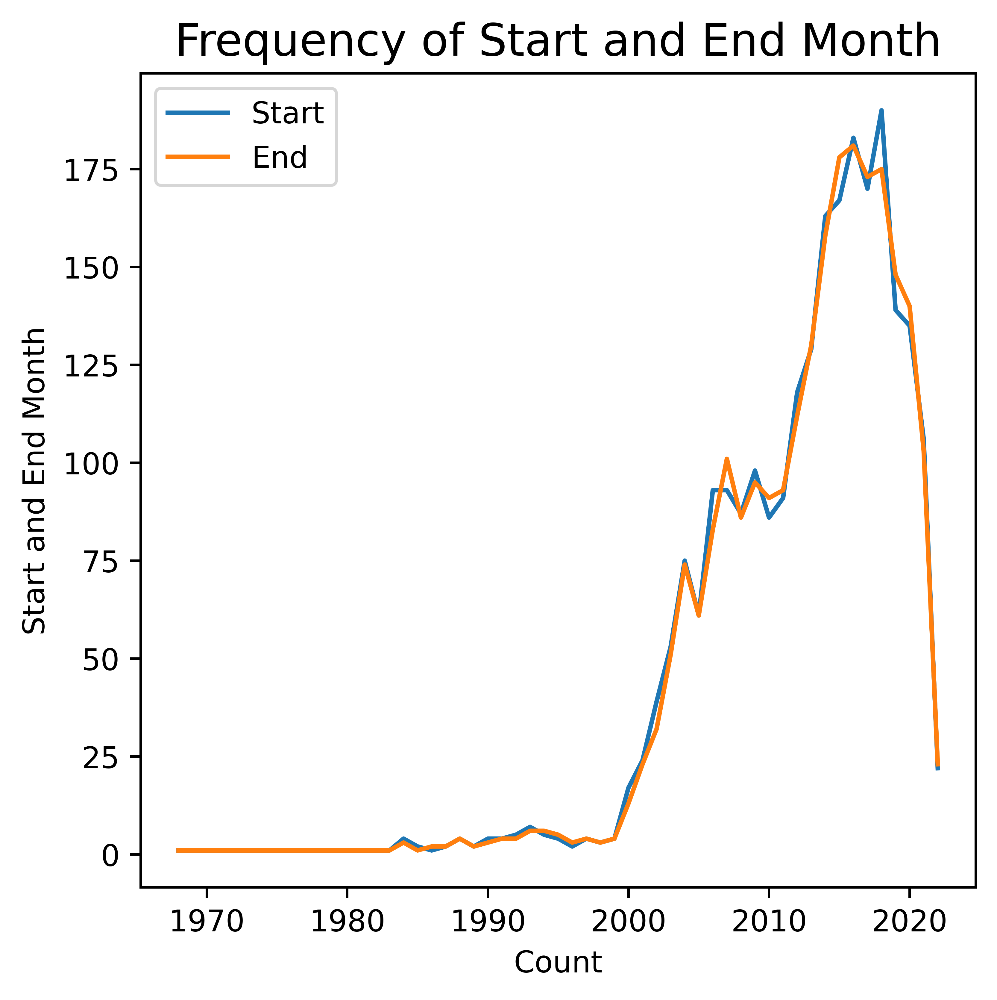

In [59]:
#plot frequency of start and end year

plt.figure(figsize = (5,5),dpi =720)
plt.title('Frequency of Start and End Month',fontsize=15)
plt.xlabel('Count',fontsize = 10)
plt.ylabel('Start and End Month',fontsize = 10) 
plt.plot(df_import['aired_start_year'].value_counts().sort_index().index,df_import['aired_start_year'].value_counts().sort_index().values, label='Start')
plt.plot(df_import['aired_end_year'].value_counts().sort_index().index,df_import['aired_end_year'].value_counts().sort_index().values,label='End')

plt.legend(loc='best')
plt.show()

**Key Takeaway:**

- Popular start Months are January, April, July, and October
- Popular end Months are March, June, September, and December 
- The least popular start and end month is May

- The year is distributed heavily during the 2000's



As the data has become more interpretable, the `aired_start` and `aired_end` will be dropped and the new `aired_start_month`, `aired_start_year`,`aired_end_month` and `aired_end_year` will be kept.

In [60]:
#Drop Aired features
df_import.drop(columns=['aired_start','aired_end'],inplace=True)

The following feature `synopsis` will be reviewed next. 

### Review Synopsis features ###

The data under `2_synopsis` and `3_synopsis` will be reviewed.

In [61]:
#Check the first 5 rows 
print('The first five rows are:')
display(df_import[['2_synopsis','3_synopsis']].head(5))

#Check the info
print('\nThe dataframe info: \n')
display(df_import[['2_synopsis','3_synopsis']].info())

The first five rows are:


,2_synopsis,3_synopsis
0,Witches are individuals with special powers li...,Witches are individuals with special powers li...
1,"Yuuta Takemoto, a sophomore at an arts college...","Yuuta Takemoto, a sophomore at an arts college..."
2,Takumi Fujiwara finally joins Ryousuke and Kei...,Takumi Fujiwara finally joins Ryousuke and Kei...
3,"In order to fulfill their dead father's wish, ...","In order to fulfill their dead father's wish, ..."
4,"Just the words ""I love you,"" and everything ch...","Just the words ""I love you,"" and everything ch..."



The dataframe info: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2404 entries, 0 to 2403
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   2_synopsis  2400 non-null   object
 1   3_synopsis  2355 non-null   object
dtypes: object(2)
memory usage: 37.7+ KB


None

The data between the two synopsis features are differ a bit given the `2_synopsis` has 2424 entries and `3_synopsis` has 2376 entries. Using both feature for NPL will not be recommended as this will likely create a uneven distribution.

Only one of the features will be kept. The word count for each row between 2_synopsis and 3_synopsis will be compared. If the word count is in favor of `3_synopsis` by more than 25%, than value in `3_synopsis` will replace that in `2_synopsis`. The data will be kept under `2_synopsis`.

Furthermore, a histogram will be used to examine the distribution. 

In [62]:
#Create dummy dataframe for given condition
focus_group_df = df_import.loc[((df_import['2_synopsis'] != df_import['3_synopsis'])&( ~df_import['3_synopsis'].isna())),:'3_synopsis'].copy()

count = 0
#List to look at word count 
list_word_count_synopsis = []
#Iterate through rows to look where 3_synopsis provide 25% more words than 2_synopsis and replace if condidtions are met
for i, row in focus_group_df.iterrows():
    two_word_count = len(row['2_synopsis'].split())
    three_word_count = len(row['3_synopsis'].split())
    if three_word_count/two_word_count >1.25:
        df_import.loc[i,'2_synopsis']=df_import.loc[i,'3_synopsis']
        count +=1
print(f'There is {count} times were 3_synopsis was greater than 2_synopsis by 25%')

#Loop to get word frequency 
for i, row in df_import.iterrows():
    try:
        two_word_count = len(df_import.loc[i,'2_synopsis'].split())
        list_word_count_synopsis.append(two_word_count)
    except:
        pass


There is 60 times were 3_synopsis was greater than 2_synopsis by 25%


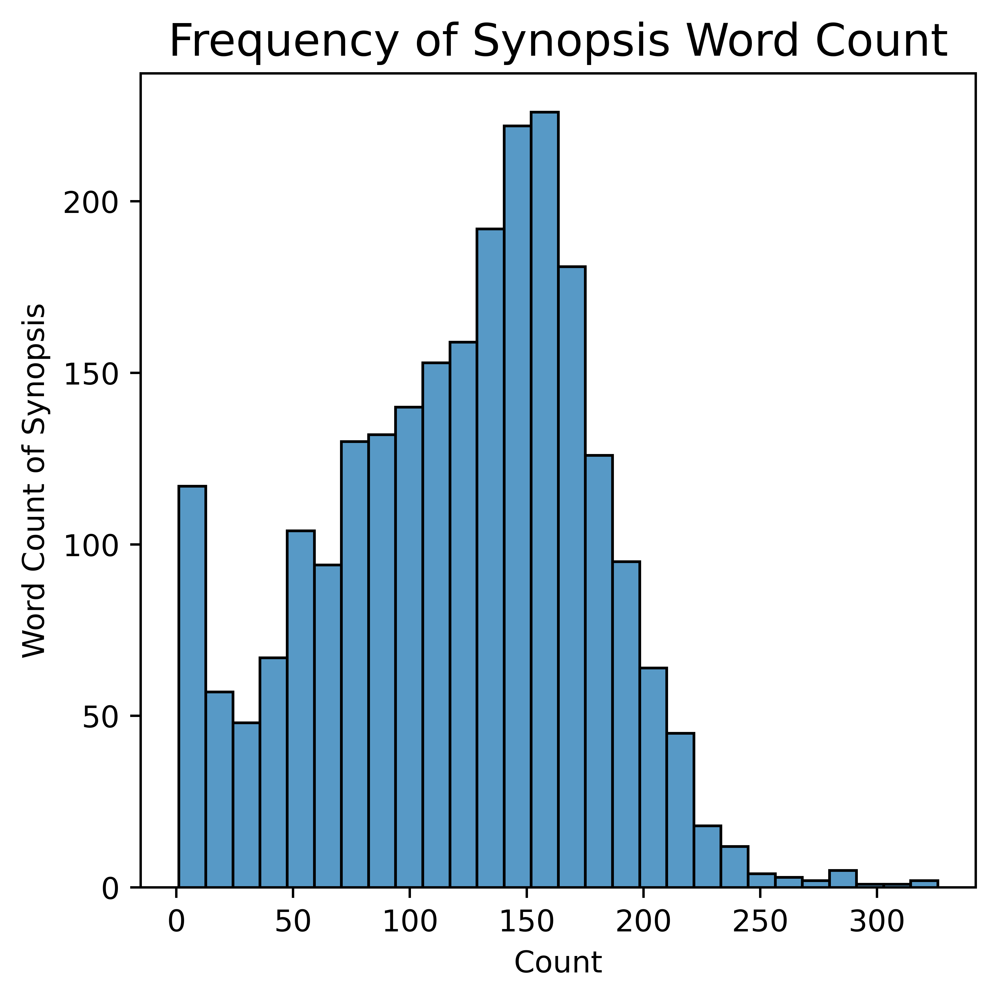

In [63]:
#plot frequency of word count
 

plt.figure(figsize = (5,5),dpi =720)
plt.title('Frequency of Synopsis Word Count',fontsize=15)
plt.xlabel('Count',fontsize = 10)
plt.ylabel('Word Count of Synopsis',fontsize = 10) 
sns.histplot(list_word_count_synopsis)
plt.show()

**Key take aways:**

- The synopsis contains information about the anime. Distribution of the amount of information held between 100 and 200 words per cell. 

- There should be enough distribution to assist in NPL.

- There is some frequency at less than 10 words. This may influence through NPL, so common words should be remove to make this effective. 

Moving forward, the `3_synopsis` feature will be dropped.

In [64]:
#Drop 3_synopsis
df_import.drop(columns='3_synopsis',inplace=True)

The following feature `revenue` will be reviewed next. 

### Review Revenue feature ###

The data under `revenue` will be reviewed and the distribution of the data will be reviewed. 

Below the distribution per describe method and histogram will be observed. 

In [65]:
print('The following are per 1000:')
display(df_import['revenue'].describe()/(10**3))

The following are per 1000:


count         2.404000
mean       4067.781228
std       14168.117905
min           2.625000
25%         197.475000
50%         671.662500
75%        2248.312500
max      302445.902625
Name: revenue, dtype: float64

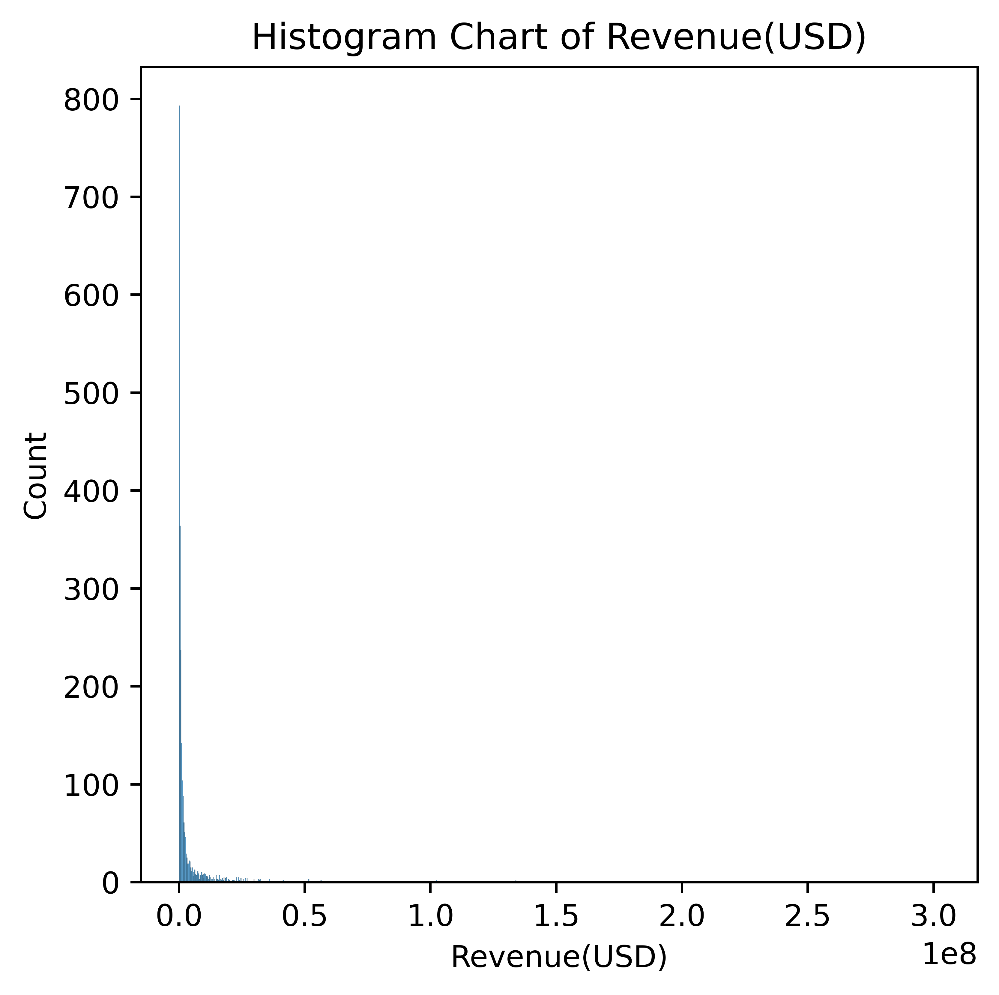

In [66]:
#plot:
quick_histogram(df_import,'revenue','auto','Revenue(USD)')

**Take aways:**

- The revenue distribution is highly right skewed 

- Range of data is very large from 2,600 to 302,445,000 USD dollars 

- The feature is required to be transformed using natural log

#### Transform the revenue data to natural log ####

The statistical information:


count    2404.000000
mean       13.425970
std         1.928939
min         7.873217
25%        12.193372
50%        13.417513
75%        14.625691
max        19.527413
Name: revenue_log, dtype: float64


Histogram plot:


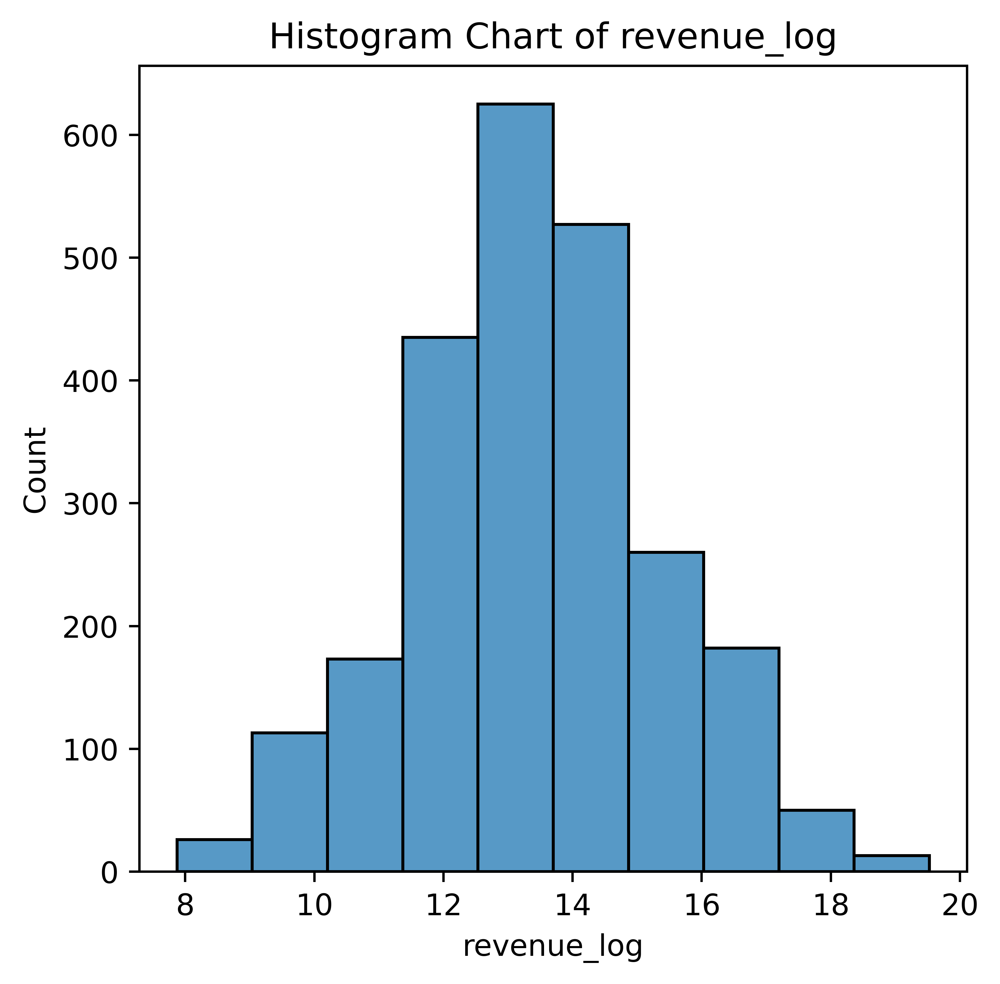

In [67]:
#Transform to natural log

df_import.loc[:,'revenue_log']= (np.log(df_import['revenue']+1))

#plot and find describe 
print('The statistical information:')
display(df_import.loc[:,'revenue_log'].describe())
print('\nHistogram plot:')
quick_histogram(df_import,'revenue_log',bins_=10)


**Key take aways:**

- Under transformed revenue, the distribution appears to follow a bell curve

- Range of data is now between 8 and 20.  

- As the transformed revenue follow a standard normal distribution best, the transformed revenue will be kept as the target variable. 

In [68]:
#Drop revenue dataframe
df_import.drop(columns = ['revenue'],inplace=True)

The following feature `Animation Studio` will be reviewed next. 

### Review Animation Studio feature ###

The data under `Animation Studio` will be reviewed for unique values and the distribution of the data will be reviewed. 

In [69]:
df_import['Animation Studio'].value_counts()

JC Staff            124
Studio Deen          90
A1 Pictures          79
Madhouse             71
Sunrise              54
                   ... 
Mook Animation        1
Team YokkyuFuman      1
G Plus                1
Wonderfarm            1
AtelierPontdarc       1
Name: Animation Studio, Length: 204, dtype: int64

The data contains more than 204 unique value.

The data will be cleaned to simplify the groups of similar data. 

In [70]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_anime_studio = df_import[['Animation Studio']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_anime_studio['Animation Studio'] = df_anime_studio['Animation Studio'].str.lower()
df_anime_studio['Animation Studio'] = df_anime_studio['Animation Studio'].str.replace('[^a-zA-Z0-9\[\],\'\"]+', '', regex=True)
                                        
df_anime_studio = pd.DataFrame(df_anime_studio['Animation Studio'].str.split(','))

    #use get dummy 
df_anime_studio= df_anime_studio['Animation Studio'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_anime_studio_sum = df_anime_studio.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_anime_studio.head(3))

print('\nValue count of all features: ')
display(df_anime_studio_sum)

Dataframe of dummy variable: 


,8bit,a1pictures,accaeffe,acgt,actas,aic,aicasta,aicbuild,aicclassic,aicplus,...,whitefox,witstudio,wolfsbane,wonderfarm,wtoonstudio,xebec,yokohamaanimationlab,yumetacompany,zerog,zexcs
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



Value count of all features: 


lapintrack                 1
teamtilldawn               1
ishimorientertainment      1
hotzipang                  1
haoliners                  1
                        ... 
sunrise                   54
madhouse                  71
a1pictures                79
studiodeen                90
jcstaff                  124
Length: 190, dtype: int64

After cleaning and creating dummy variables, there are 190 unique values and range of repeated use varies greatly. The information will plotted for the first 50 Studio with dashed line at 25 count. 

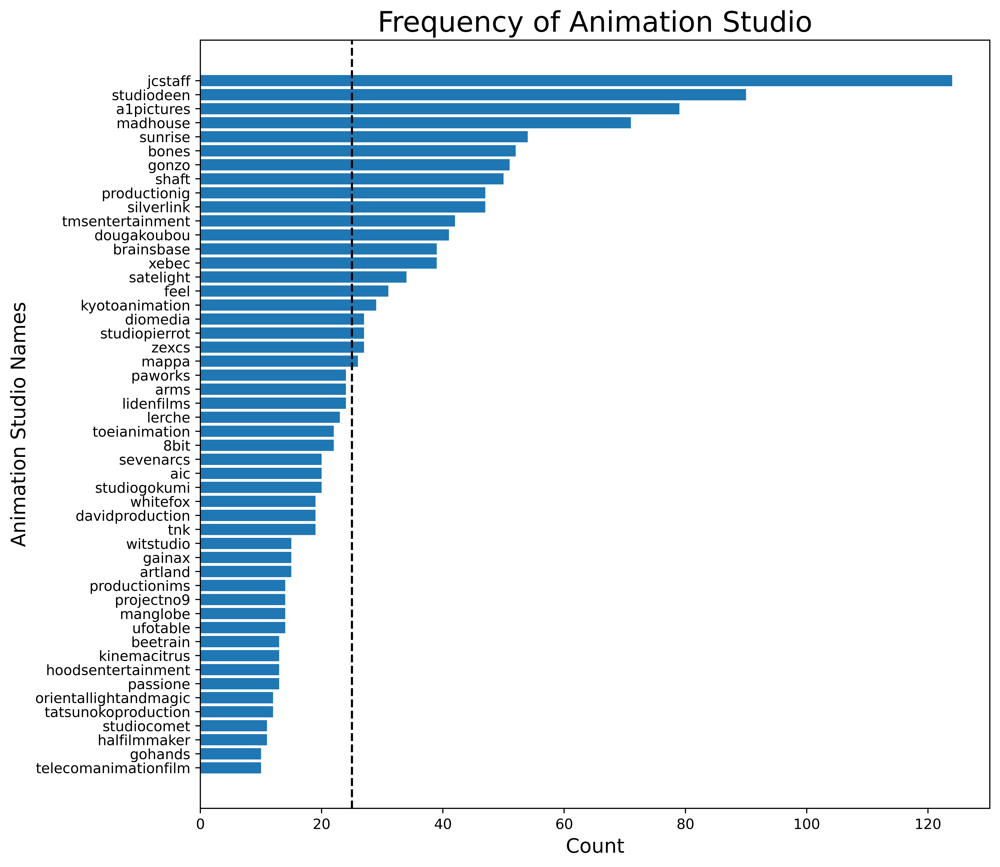

In [71]:
#plot of df_publisher_sum

plt.figure(figsize = (10,10),dpi =720)
plt.title('Frequency of Animation Studio',fontsize=20)
plt.xlabel('Count',fontsize = 14)
plt.ylabel('Animation Studio Names',fontsize = 14)
plt.axvline(25, color = 'black',linestyle='dashed')
plt.barh(df_anime_studio_sum.index[-50:],df_anime_studio_sum.values[-50:]);

The Animation Studio will be check to determine if information overlaps either producer, licensor, and studio.

A count will be created to look how unique values in Animation Studio appear in these features. 

In [72]:
#Create a list for publisher, producer, licensor, studio

df_anime_studio_sum_index = list(df_anime_studio_sum.index)

df_producer_sum_index = list(df_producer_sum.index)
df_licensor_sum_index = list(df_licensor_sum.index)
df_studio_sum_index = list(df_studio_sum.index)

#check publisher in producer
count_p =0
p_list = []
count_l =0
l_list = []
count_s =0
s_list = []

#Loop to check the if item per list is present in all other list
for item in df_anime_studio_sum_index:
    if item in df_producer_sum_index:
        count_p +=1
        p_list.append(item
                     )
    if item in df_licensor_sum_index:
        count_l +=1
        l_list.append(item)
        
    if item in df_studio_sum_index:
        count_s +=1
        s_list.append(item)
        
print(f'The total count of common values between animation studio and producer is {count_p}. \n')
print(f'The total count of common values between animation studio and licensor is {count_l}. \n')
print(f'The total count of common values between animation studio and studio is {count_s}. \n')

The total count of common values between animation studio and producer is 55. 

The total count of common values between animation studio and licensor is 0. 

The total count of common values between animation studio and studio is 158. 



There is an overlap with feature studio. As such, `animation studio` will be combined with `studio`.


In [73]:
#combine df_anime_studio and df_studio


#List of columns for both df
list_studio_main = list(df_studio.columns)
list_studio_second = list(df_anime_studio.columns)

# loop to determine if col from anime studio is in studio list
for item in list_studio_second:
    if item in list_studio_main:
        
        #if present, add columns from each df together and store in df_studio
        df_studio[item] = df_anime_studio[item] + df_studio[item]
        
        #All value is binary between 0 and 1
        df_studio.loc[df_studio[item]>0,item] = 1
    
    #else, append column from animation studio to 
    else:
        df_studio=pd.concat([df_studio,df_anime_studio[item]],axis=1)


Following the combination of the features, the actions for `studio` to reduce variables will be taken. 

The studio will be revised to hold at least 25 repeating values. 

In [74]:
#reset df_studio_sum
df_studio_sum = df_studio.sum()

# Total values 
print(f'Total values are {df_studio_sum.sum()}')

#drop unneed data where total count is less than 25 
print(f'Total values drops are {df_studio_sum[df_studio_sum<25].sum()}')
col_drop = df_studio_sum[df_studio_sum<25].index

df_studio.drop(columns = col_drop, inplace = True)
df_studio=df_studio.add_prefix('studio_')

#Total studio left
print(f'Total studio variables left are {len(df_studio.columns)}')


Total values are 2730
Total values drops are 1127
Total studio variables left are 31


`Animation_Studio` will be dropped latter in the notebook. The following feature `Publisher` will be reviewed. 

### Review Publisher feature ###

The data under `Publisher` will be reviewed for unique values and the distribution of the data will be reviewed. 

In [75]:
df_import['Publisher'].value_counts()

Aniplex              254
Kadokawa             197
Bandai Visual        149
King Records         142
Pony Canyon          124
                    ... 
DIRECTIONS/RIGHTS      1
Softgarage             1
Handsome Records       1
m.o.e.                 1
Nikkatsu               1
Name: Publisher, Length: 108, dtype: int64

The data contains more than 108 unique value.

The data will be split by 'comma'.

In [76]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_publisher = df_import[['Publisher']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_publisher['Publisher'] = df_publisher['Publisher'].str.lower()
df_publisher['Publisher'] = df_publisher['Publisher'].str.replace('[^a-zA-Z0-9\[\],\'\"]+', '', regex=True)
                                        
df_publisher = pd.DataFrame(df_publisher['Publisher'].str.split(','))

    #use get dummy 
df_publisher= df_publisher['Publisher'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_publisher_sum = df_publisher.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_publisher.head(3))

print('\nValue count of all features: ')
display(df_publisher_sum)

Dataframe of dummy variable: 


,5pb,amgentertainment,amusesoft,aniplex,ariolajapan,asahiproduction,asmikace,avex,bandaivisual,being,...,tvasahi,tvsaitama,tvtokyo,twinengine,vap,victorentertainment,waltdisney,warnerbrothers,yostar,zeroa
0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0



Value count of all features: 


5pb                   1
goodsmilefilm         1
handsomerecords       1
hobbyjapan            1
jvcentertainment      1
                   ... 
ponycanyon          124
kingrecords         142
bandaivisual        149
kadokawa            197
aniplex             254
Length: 103, dtype: int64

After cleaning and creating dummy variables, there are 103 unique values and the range of repeated use varies greatly. The information will plotted for the first 50 Publisher with dashed line at 25 count. 

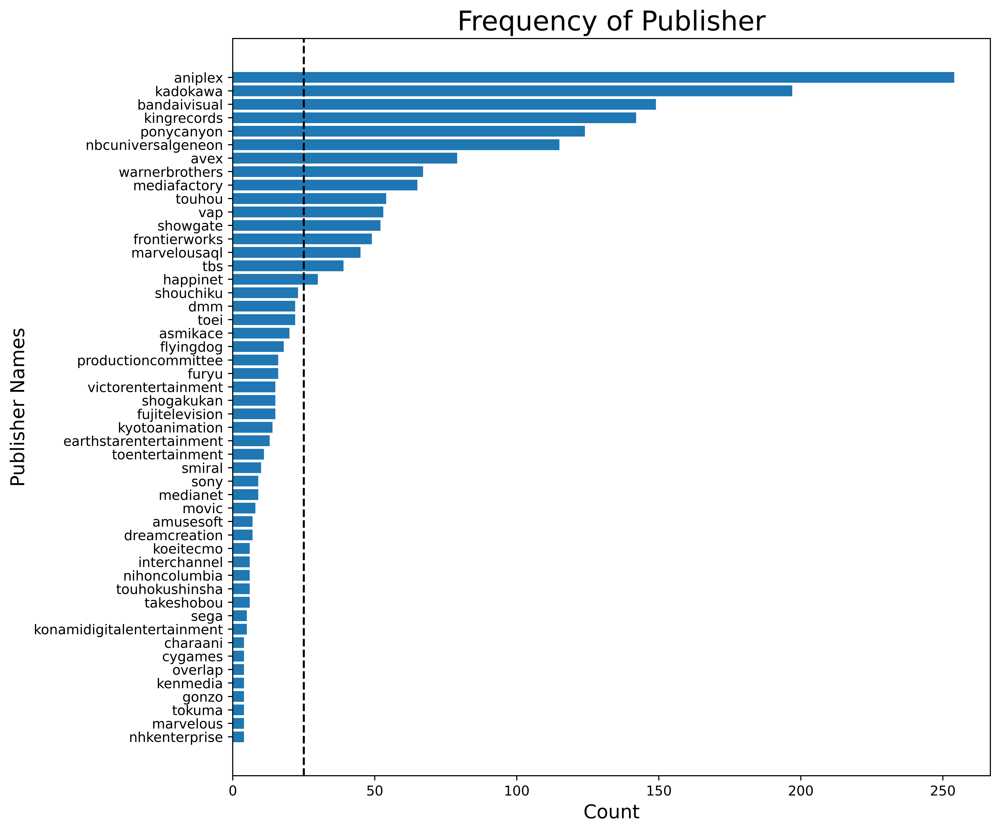

In [77]:
#plot of df_publisher_sum

plt.figure(figsize = (10,10),dpi =720)
plt.title('Frequency of Publisher',fontsize=20)
plt.xlabel('Count',fontsize = 14)
plt.ylabel('Publisher Names',fontsize = 14)
plt.axvline(25, color = 'black',linestyle='dashed')
plt.barh(df_publisher_sum.index[-50:],df_publisher_sum.values[-50:]);

The publisher will be checked to determine if information overlaps either producer, licensor, and studio.

A count will be created to look how unique values in Publisher appear in these features. 

In [78]:
#Create a list for publisher, producer, licensor, studio

df_publisher_sum_index = list(df_publisher_sum.index)

df_producer_sum_index = list(df_producer_sum.index)
df_licensor_sum_index = list(df_licensor_sum.index)
df_studio_sum_index = list(df_studio_sum.index)

#check publisher in producer
count_p =0
p_list = []
count_l =0
l_list = []
count_s =0
s_list = []

#Loop to check the if item per list is present in all other list
for item in df_publisher_sum_index:
    if item in df_producer_sum_index:
        count_p +=1
        p_list.append(item
                     )
    if item in df_licensor_sum_index:
        count_l +=1
        l_list.append(item)
        
    if item in df_studio_sum_index:
        count_s +=1
        s_list.append(item)
        
print(f'The total count of common values between publisher and producer is {count_p}. \n')
print(f'The total count of common values between publisher and licensor is {count_l}. \n')
print(f'The total count of common values between publisher and studio is {count_s}. \n')

The total count of common values between publisher and producer is 54. 

The total count of common values between publisher and licensor is 0. 

The total count of common values between publisher and studio is 9. 



There is data overlap for publisher against producer and studio. As such, `publisher` will be kept unless proven there is not enough  information in the null check.


Given the the size of the potential dummy variables, the following action will be taken:
- Remove publisher that appear less than 25 times. 
- If no publisher is listed, publisher can be assumed to not be part of the dummy variables. 

In [79]:
# Total values 
print(f'Total values are {df_publisher_sum.sum()}')

#drop unneed data where total count is less than 25 
print(f'Total values drops are {df_publisher_sum[df_publisher_sum<25].sum()}')
col_drop = df_publisher_sum[df_publisher_sum<25].index

df_publisher.drop(columns = col_drop, inplace = True)
df_publisher=df_publisher.add_prefix('publisher_')

#Total producers left
print(f'Total genre left are {len(df_publisher.columns)}')


Total values are 1937
Total values drops are 423
Total genre left are 16


After removing publisher that appear less than 25 times, the total number of publisher is 16. From about 103, this value is acceptable.

The following feature `Distributor` will be reviewed. 

### Review Distributor feature ###

The data under `Distributor` will be reviewed for unique values and the distribution of the data will be reviewed. 

In [80]:
df_import['Distributor'].value_counts()

Sony                      270
Kadokawa                  211
Pony Canyon               207
NBC Universal (Geneon)    169
Media Factory             166
                         ... 
NHK Enterprise              1
Aniplex                     1
Polydoll                    1
DIRECTIONS/RIGHTS           1
Marvelous                   1
Name: Distributor, Length: 72, dtype: int64

The data contains more than 72 unique value.

The data will be split by 'comma'.

In [81]:
# Create a dummy to get sum of value by unique values  

    #dummy dataframe to turn to list
df_distributor = df_import[['Distributor']].copy()

    #transform to remove space and unusal characters and transform number to lower case
df_distributor['Distributor'] = df_distributor['Distributor'].str.lower()
df_distributor['Publisher'] = df_distributor['Distributor'].str.replace('[^a-zA-Z0-9\[\],\'\"]+', '', regex=True)
                                        
df_distributor = pd.DataFrame(df_distributor['Distributor'].str.split(','))

    #use get dummy 
df_distributor= df_distributor['Distributor'].str.join('|').str.get_dummies()

    #Create series to get total count per producer 
df_distributor_sum = df_distributor.sum().sort_values(ascending=True)

print('Dataframe of dummy variable: ')
display(df_distributor.head(3))

print('\nValue count of all features: ')
display(df_distributor_sum)

Dataframe of dummy variable: 


,?,amazing dc,amuse soft,aniplex,asmik ace,avex,bandai visual,being,bell plans,bmg japan,...,top marshal,touhoku penet,touhokushinsha,touhou,tv saitama,tv tokyo,vap,victor entertainment,walt disney,warner brothers
0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



Value count of all features: 


?                           1
walt disney                 1
gonzo                       1
marvelous                   1
medianet                    1
                         ... 
media factory             166
nbc universal (geneon)    169
pony canyon               207
kadokawa                  211
sony                      270
Length: 69, dtype: int64

After cleaning and creating dummy variables, there are 103 unique values and range of repeated use varies greatly. The information will plotted for the first 50 Publisher with dashed line at 25 count. 

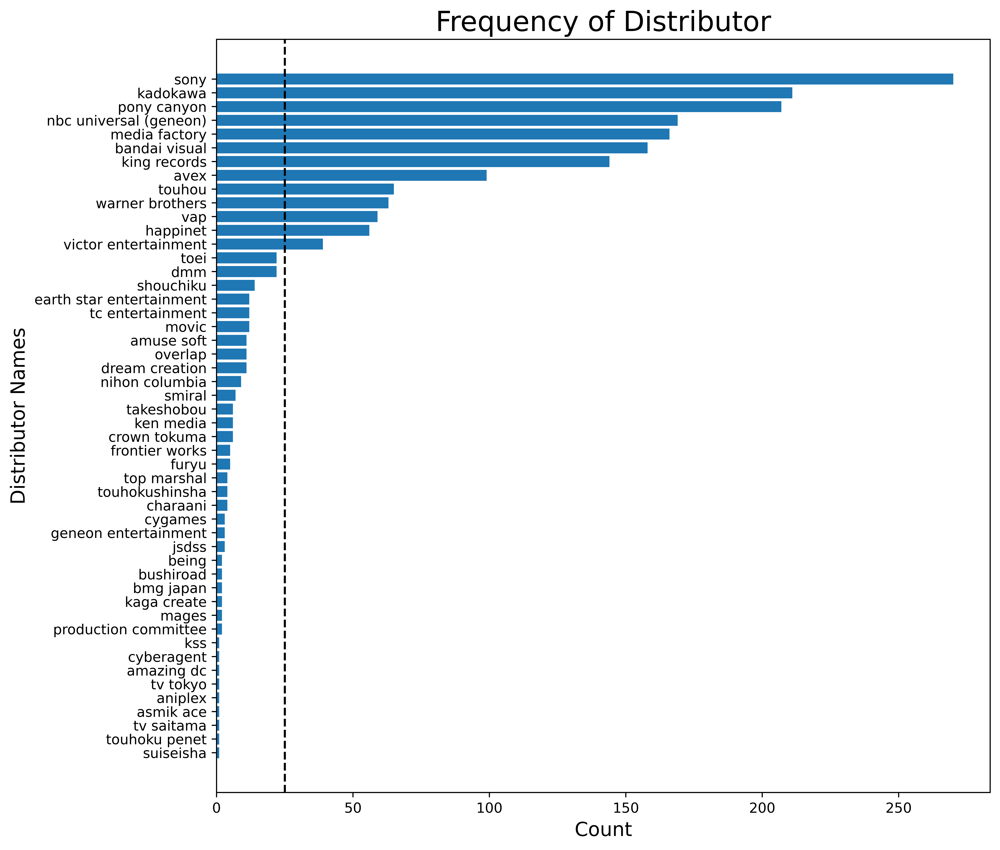

In [82]:
#plot of df_publisher_sum

plt.figure(figsize = (10,10),dpi =720)
plt.title('Frequency of Distributor',fontsize=20)
plt.xlabel('Count',fontsize = 14)
plt.ylabel('Distributor Names',fontsize = 14)
plt.axvline(25, color = 'black',linestyle='dashed')
plt.barh(df_distributor_sum.index[-50:],df_distributor_sum.values[-50:]);

The distributor will be check to determine if information overlaps either producer, licensor, and studio.

A count will be created to look how unique values in distributor appear in these features. 

In [83]:
#Create a list for distributor, producer, licensor, studio

df_distributor_sum_index = list(df_distributor_sum.index)

df_producer_sum_index = list(df_producer_sum.index)
df_licensor_sum_index = list(df_licensor_sum.index)
df_studio_sum_index = list(df_studio_sum.index)

#check distributor in producer,licensor, studio
count_p =0
count_l =0
count_s =0

#Loop to check the if item per list is present in all other list
for item in df_distributor_sum_index:
    if item in df_producer_sum_index:
        count_p +=1
    if item in df_licensor_sum_index:
        count_l +=1
    if item in df_studio_sum_index:
        count_l +=1
print(f'The total count of common values between distributor and producer is {count_p}. \n')
print(f'The total count of common values between distributor and licensor is {count_l}. \n')
print(f'The total count of common values between distributor and studio is {count_s}. \n')

The total count of common values between distributor and producer is 14. 

The total count of common values between distributor and licensor is 2. 

The total count of common values between distributor and studio is 0. 



For distributor, there appear to be overlap between licensor and studio. As such, `distributor` will be kept unless proven there is not enough information in the null check.


Given the the size of the potential dummy variables, the following action will be taken:
- Remove distributor that appear less than 25 
- If no distributor is listed, distributor can be assumed to not be part of the dummy variables. 

In [84]:
# Total values 
print(f'Total values are {df_distributor_sum.sum()}')

#drop unneed data where total count is less than 25 
print(f'Total values drops are {df_distributor_sum[df_distributor_sum<25].sum()}')
col_drop = df_distributor_sum[df_distributor_sum<25].index

df_distributor.drop(columns = col_drop, inplace = True)
df_distributor=df_distributor.add_prefix('distributor_')

#Total producers left
print(f'Total genre left are {len(df_distributor.columns)}')


Total values are 1938
Total values drops are 232
Total genre left are 13


After removing distributor that appear less than 25 times, the total number of licensor is 13. From about 69, this value is acceptable.

### Review all data types ###

All features have been reviewed and altered to best reflect the data. 

Dataframes containing dummy variables for `genre` , `related_keys`,`producer`,`licensor`,and `studio` were created. These dataframe uses integer datatype. 

The datatype for the main dateframe `df_import` will be reviewed. 



In [85]:
#Print datatype for all features
df_import.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2404 entries, 0 to 2403
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   title              2404 non-null   object 
 1   type               2404 non-null   object 
 2   source             2404 non-null   object 
 3   episodes           2301 non-null   float64
 4   rating             2391 non-null   object 
 5   producer           1638 non-null   object 
 6   licensor           1247 non-null   object 
 7   studio             2327 non-null   object 
 8   genre              2397 non-null   object 
 9   2_synopsis         2400 non-null   object 
 10  Animation Studio   1938 non-null   object 
 11  Publisher          1938 non-null   object 
 12  Distributor        1938 non-null   object 
 13  episodes_log       2301 non-null   float64
 14  duration_min       2221 non-null   float64
 15  duration_min_log   2221 non-null   float64
 16  related_keys       2404 

According to the date:
- `episodes`, `episode_log`,`duration_min`,`duration_min_log`, `aired_start_year`,`aired_start_month`, `aired_end_year`,`aired_end_month`, and `revenue_log` is correctly noted as numeric.

- All other features are noted as object. 

## Evaluate Missing Values ##

Data will be evaluated for missing values .

In [86]:
#Review the data by percentage


print('The missing values percentage by columns is:')
df_import.isna().mean()*100

The missing values percentage by columns is:


title                 0.000000
type                  0.000000
source                0.000000
episodes              4.284526
rating                0.540765
producer             31.863561
licensor             48.128120
studio                3.202995
genre                 0.291181
2_synopsis            0.166389
Animation Studio     19.384359
Publisher            19.384359
Distributor          19.384359
episodes_log          4.284526
duration_min          7.612313
duration_min_log      7.612313
related_keys          0.000000
aired_start_month     0.083195
aired_start_year      0.083195
aired_end_month       0.748752
aired_end_year        0.748752
revenue_log           0.000000
dtype: float64

**Take aways:**
- Those percent values below 3% will be replaced with median for numeric and mode for single item
    - This includes: `episode`, `episode_log`,`rating`, and `aired`
- Those below 3% and provide multiple values per cell include: `genre` and `2_synopsis`
    - `2_synopsis` and `genre` will turned to dummy variables. As these are low percentage of the data, they will hold no value in the dummy variable 
    - Those above 3% include:  `producer`, `licensor`,`studio`,`Animation Studio`,`Publisher`, `Distributor`,`duration`, and `duration_log`
    - As `Studio` and `Animation Studio` will be paired. The percentage will likely decrease below 3%. If so, missing value will be acceptable. 
    - `Duration`, and `duration_log` will be filled with median value. These data can not be filled as null nor zero. 
    - All other will need to be explored. 


### Fill missing values with median and mode ###

In [87]:
#fill missing values

#using Median
    #episodes
df_import['episodes'].fillna(df_import['episodes'].median(),inplace=True)
    #Episodes_log
df_import['episodes_log'].fillna(df_import['episodes_log'].median(),inplace=True)
    #aired
df_import['aired_end_month'].fillna(df_import['aired_end_month'].median(),inplace=True)
df_import['aired_end_year'].fillna(df_import['aired_end_year'].median(),inplace=True)
df_import['aired_start_month'].fillna(df_import['aired_start_month'].median(),inplace=True)
df_import['aired_start_year'].fillna(df_import['aired_start_year'].median(),inplace=True)

    #Duration
df_import['duration_min'].fillna(df_import['duration_min'].median(),inplace=True)
df_import['duration_min_log'].fillna(df_import['duration_min_log'].median(),inplace=True)

#Using Mode
    #rating
df_import['rating'].fillna((df_import['rating'].mode().values[0]),inplace=True)



### Check Synopsis and genre  ###

As Synopsis is required for NPL, having nan values may cause error. As the NPL will correct to keep only English words, using a special character like '.' as a placeholder will be sufficient. 

In [88]:
#fill synopsis with special character 
df_import['2_synopsis'].fillna('.',inplace=True)

In [89]:
#check genre
df_import[df_import['genre'].isna()].head()

,title,type,source,episodes,rating,producer,licensor,studio,genre,2_synopsis,...,Distributor,episodes_log,duration_min,duration_min_log,related_keys,aired_start_month,aired_start_year,aired_end_month,aired_end_year,revenue_log
1833,entotsu machi no poupelle,Movie,Other Novel/Book,1.0,Unknown,NaN,NaN,NaN,NaN,There is a town surrounded by a wall that stan...,...,NaN,0.693147,24.0,3.218876,0,12.0,2020.0,7.0,2014.0,16.842901
2044,re stage dream days,TV,Other,12.0,PG-13 - Teens 13 or older,NaN,NaN,NaN,NaN,Mana Shikimiya has just transferred into Mareh...,...,Pony Canyon,2.564949,23.0,3.178054,0,7.0,2019.0,9.0,2019.0,12.947477
2124,sore ike anpanman kirameke ice no kuni no v...,Movie,Other Novel/Book,1.0,G - All Ages,NaN,NaN,NaN,NaN,"The film's story centers on Princess Vanilla, ...",...,NaN,0.693147,61.0,4.127134,0,6.0,2019.0,7.0,2014.0,15.368378
2247,assault lily bouquet,TV,Other,12.0,PG-13 - Teens 13 or older,NaN,NaN,NaN,NaN,"Fifty years ago, mysterious creatures known as...",...,Bushiroad,2.564949,24.0,3.218876,0,10.0,2020.0,12.0,2020.0,14.311365
2287,sore ike anpanman fuwa fuwa fuwaly to kumo n...,Movie,Other Novel/Book,1.0,G - All Ages,NaN,NaN,NaN,NaN,"Anpanman, his friends, and the cloud child Fuw...",...,NaN,0.693147,24.0,3.218876,0,6.0,2021.0,7.0,2014.0,13.867333


Given low percentage of missing values and no other information, the mode for genre will be used to fill the missing values. 

It should be noted that the dummy variable (df_genre) will also be updated

In [90]:
# Determine most common genre
common_genre =df_genre_sum.idxmax()
index_genre_missing = df_import[df_import['genre'].isna()].index


#Fill at df_import 
df_import['genre'].fillna(common_genre,inplace=True)

#Fill at df_genre (dummy variable at genre_'common_genre' column)
genre = 'genre_'+common_genre

df_genre.loc[index_genre_missing,[genre]] = 1


### Check Related ###

Examine the total null per `Related_key` given thatt values equals 0 are considered null. 

In [91]:
#check 
percent_null = (df_import['related_keys']=='0').sum()/df_import.shape[0]*100

print(f'The null percentage of studio and animation studio combine is {percent_null:.2f}%')

The null percentage of studio and animation studio combine is 20.05%


Higher percentage of missing values is present. Considering that related keys refers to how another anime may be related, missing value may imply that anime does not have a related anime. As such, missing values make sense in this feature. 

As such, missing value will be carried as 0 for all binarized dummy variables. 

### Check studio ###

Examine the total null given studio and animation studio

In [92]:
#check 
percent_null = ((df_import['studio'].isna()) & (df_import['Animation Studio'].isna())).sum()/df_import.shape[0]*100

print(f'The null percentage of studio and animation studio combined is {percent_null:.2f}%')

The null percentage of studio and animation studio combined is 2.41%


As such, most common studio will be used. 

As this is a list is used, only the dummy variable (df_studio) will be updated

In [93]:
# Determine most common studio
common_studio =df_studio_sum.idxmax()
index_studio_missing = df_import[((df_import['studio'].isna()) & (df_import['Animation Studio'].isna()))].index


#Fill at df_studio (dummy variable at studio_'common_studio' column)
studio = 'studio_'+common_studio

df_studio.loc[index_studio_missing,[studio]] = 1


### Check producer, licensor, Publisher, Distributor ###

In [94]:
columns_check = ['producer','licensor','Publisher','Distributor']

print('The missing values by percentage is as follows:')
display(df_import[columns_check].isna().mean()*100)

The missing values by percentage is as follows:


producer       31.863561
licensor       48.128120
Publisher      19.384359
Distributor    19.384359
dtype: float64

In [95]:
#Check what the perecent of missing value is present given all features above are combined
condition_1 = df_import['producer'].isna()
condition_2 = df_import['licensor'].isna()
condition_3 = df_import['Publisher'].isna()
condition_4 = df_import['Distributor'].isna()


percent_null = (condition_1&condition_2&condition_3&condition_4).sum()/df_import.shape[0]*100

print(f'The percent of missing values is {percent_null:.2f}% if all values in Producer, Licensor, Publisher,\
Distributor were combined.' )

The percent of missing values is 8.15% if all values in Producer, Licensor, Publisher,Distributor were combined.


Looking at each feature, a significant amount of information is missed. It would not be appropriate to use mode or median as values will be highly skewed.

Given values have been turned to dummy variables and all features are related to production, it may be best to consider these features as a cumulation of production value. The overall missing value if combined will be 8.81%.  

As dummy variables were created for each of these features, using all variable for insight into production will provide about 92% of the data. The other 8% will be taken in as entries where all binarized dummy variable are taken as 0. 

### Final Check of missing data ###

In [96]:
#Review the data by percentage


print('The missing values percentage by columns is:')
df_import.isna().mean()*100

The missing values percentage by columns is:


title                 0.000000
type                  0.000000
source                0.000000
episodes              0.000000
rating                0.000000
producer             31.863561
licensor             48.128120
studio                3.202995
genre                 0.000000
2_synopsis            0.000000
Animation Studio     19.384359
Publisher            19.384359
Distributor          19.384359
episodes_log          0.000000
duration_min          0.000000
duration_min_log      0.000000
related_keys          0.000000
aired_start_month     0.000000
aired_start_year      0.000000
aired_end_month       0.000000
aired_end_year        0.000000
revenue_log           0.000000
dtype: float64

Missing values have been properly addressed.

## Evaluate Duplicated Values ## 

Dataframe will be evaluated for duplicated rows, columns, ID, and titles

### Check for row duplication

In [97]:
#row duplicated
print(f'The total number of duplicated rows is: {df_import.duplicated().sum()}.')

#Drop if present
df_import.drop_duplicates(inplace = True)

The total number of duplicated rows is: 0.


### Check for column duplication

In [98]:
#Column duplicated
print(f'The total number of duplicated columns is: {df_import.T.duplicated().sum()}.')

 

The total number of duplicated columns is: 0.


### Check for id and title duplication

In [99]:
print(f'Are Index unique: {len(set(df_import.index))==len((df_import.index))}')

Are Index unique: True


In [100]:
#title duplicated
print(f"The total number of duplicated titles is: {df_import[['title']].duplicated().sum()}.")

The total number of duplicated titles is: 0.


**Take aways:**
- No duplicated entries for rows, columns, title and index were found

## Evaluate Distribution of continuous Features against Target ##



The data has been throughly evaluated per *feature*. An additional evaluation of the *feature* against other *features* will be taken. 

For this portion, the *features* will be examined against revenue. 

For categorical *features*, histograms will be created for revenue and grouped by unique variables per *feature*. As some *features* contain many unique variables, histograms will be limited to the top 5 to 10 most frequent variables. 

For numeric *features*, a scatter plot will be created between *features* and revenue.

### Categorical data against Revenue (Target) 

In [101]:
#import library to better show histograms
import matplotlib.style
import matplotlib as mpl
from matplotlib import cm
mpl.style.use('classic')

#### Anime Type 

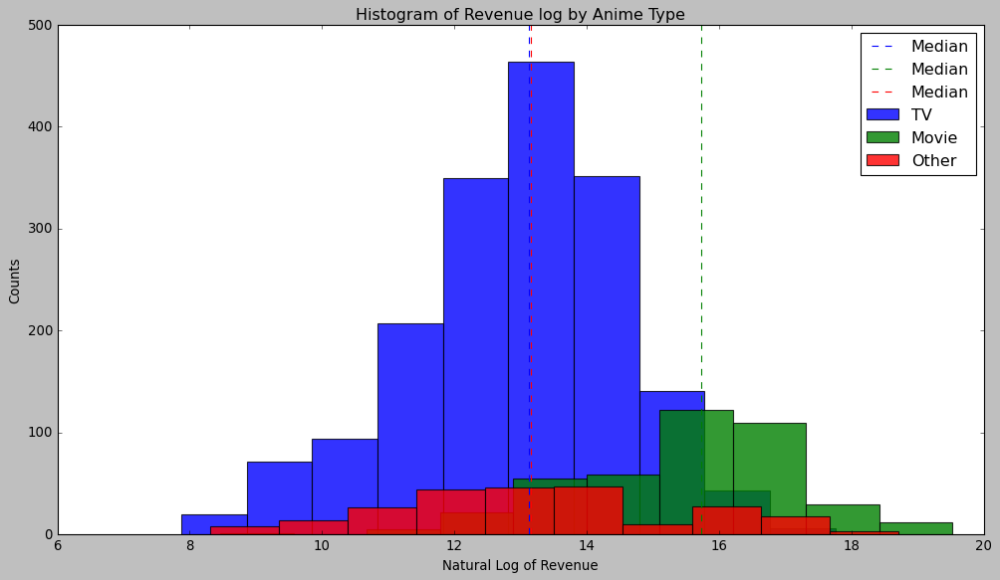

In [102]:
plt.figure(figsize=(15,8))
#plot histogram per unique variable under feature
for i,value in enumerate(df_import['type'].unique()):
    condition = df_import['type']==value
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.8)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',c=color[i])
plt.title('Histogram of Revenue log by Anime Type')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()


#### Take away: ###
- Distribution of Revenue per TV follows a normal distribution best.
- Median of Revenue per Movie appears to be higher than the other Anime types.
- Median of Revenue per Tv and Other are very similar.  

#### Anime Source  

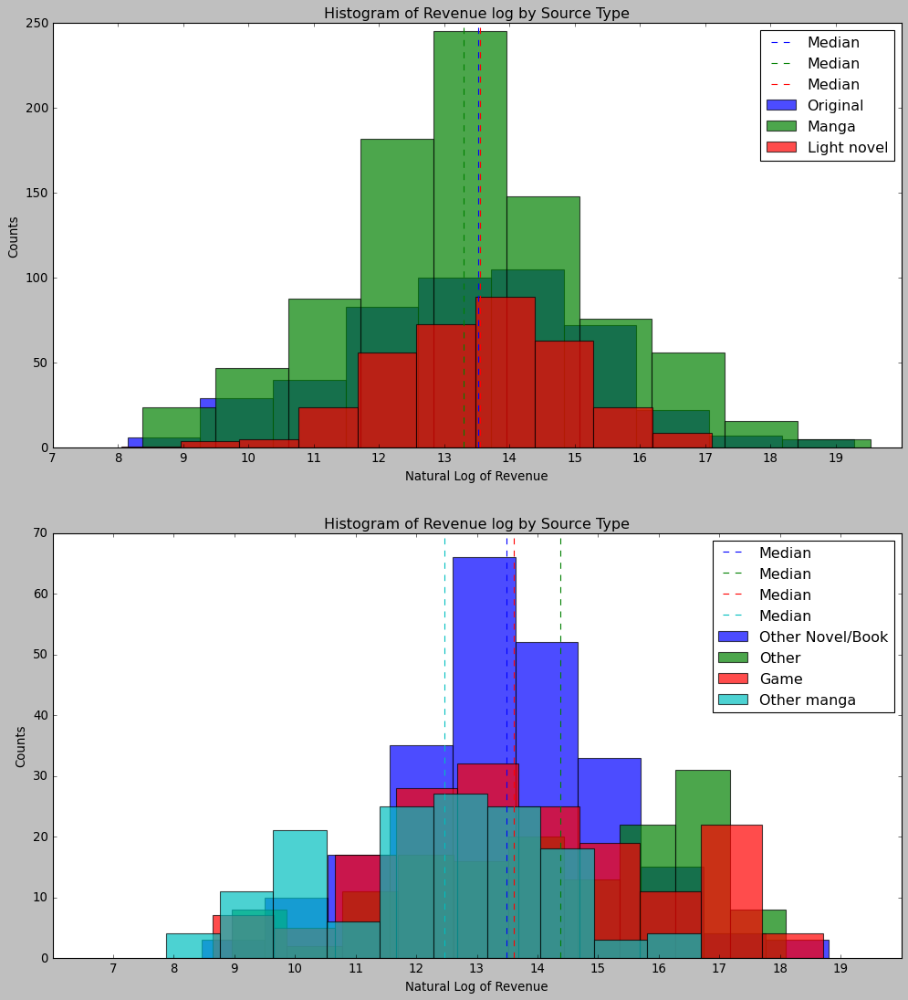

In [103]:
plt.subplots(2,1,figsize=(15,16))
plt.subplot(2,1,1)
# Create 2 Histogram plots for all source types 
    #Iterate Plot per unique values (first 3)
for i,value in enumerate(df_import['source'].unique()[0:3]):
    condition = df_import['source']==value
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.7)
    color=plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
plt.title('Histogram of Revenue log by Source Type')
plt.xticks(np.arange(7,20))
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()


plt.subplot(2,1,2)
 #Iterate Plot per unique values (last 4)
for i,value in enumerate(df_import['source'].unique()[3:]):
    condition = df_import['source']==value
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.7)
    color=plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
plt.title('Histogram of Revenue log by Source Type')
plt.xlabel('Natural Log of Revenue')
plt.xticks(np.arange(7,20))
plt.ylabel('Counts')
plt.legend()
plt.show()

#### Take away: ###
- Distribution of Revenue per Original, manga, and light novel source types follows a normal distribution best and median revenue for these groups appear to be similar.
- Median of Revenue per Other source type appears to be higher than the other source types.


#### Anime Rating  

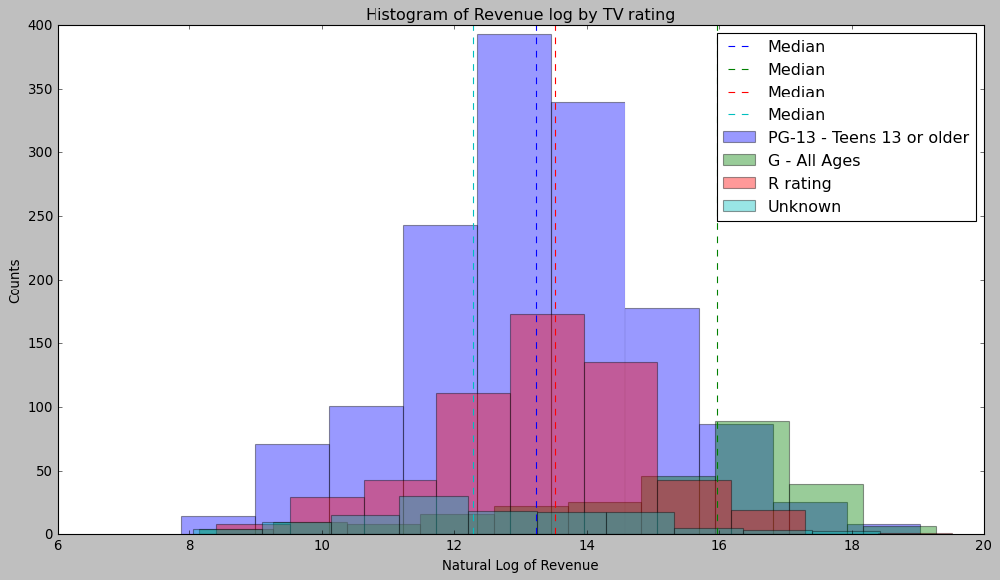

In [104]:
#plot histogram per unique variable under feature

plt.figure(figsize=(15,8))
for i,value in enumerate(df_import['rating'].unique()):
    condition = df_import['rating']==value
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
plt.title('Histogram of Revenue log by TV rating')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()

#### Take away: ###
- Distribution of Revenue per PG -13 rating follows a normal distribution best 
- Median revenue per PG-13 and R ratings appear to be similar.
- Median of Revenue per G rating appears to be higher than the other rating.


#### Anime Producer  

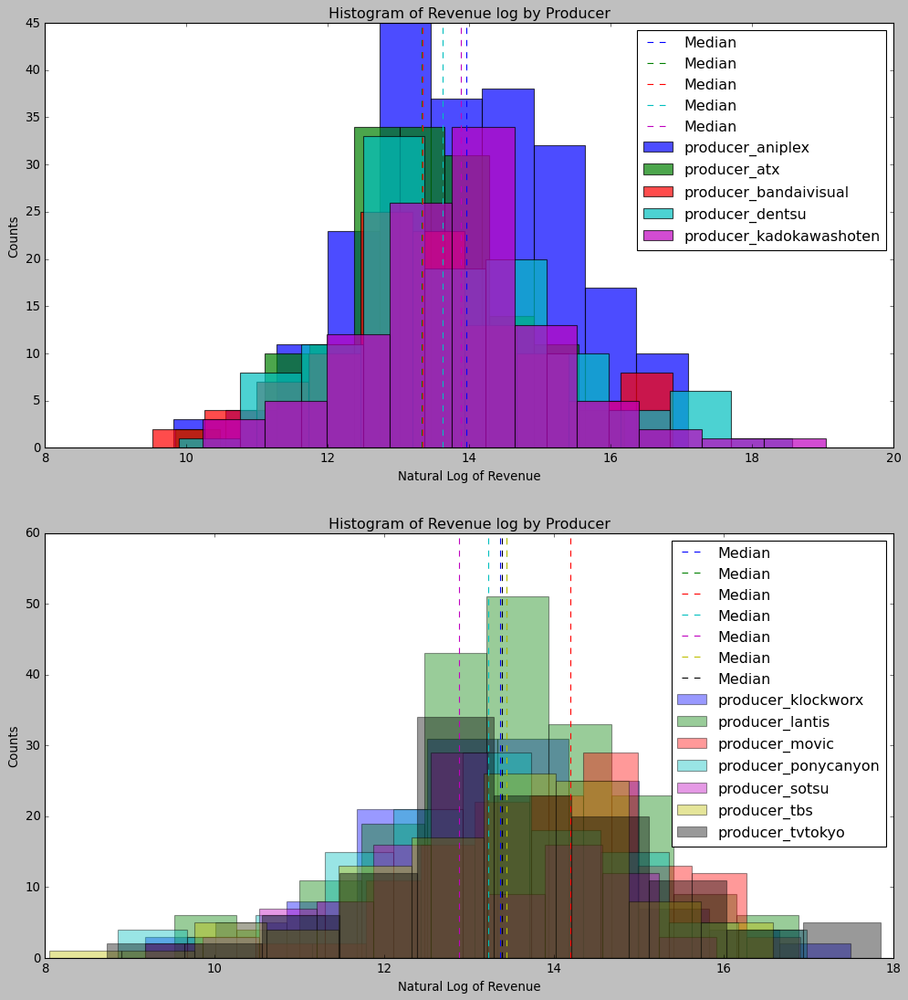

In [105]:
#Create list to get unique variables from df_producer
list_columns = []
for value in df_producer.columns:
    
    if df_producer[value].sum()>100:
        list_columns.append(value)

#plot histogram per unique variable under feature
#Create subplot to fit multiple histgrams 
    #Plot first 5
plt.subplots(2,1,figsize=(15,16))
plt.subplot(2,1,1)
for i,value in enumerate(list_columns[0:5]):
    condition = df_producer[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.7)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
    
plt.title('Histogram of Revenue log by Producer')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()

    #Plot missing variables
plt.subplot(2,1,2)
for i,value in enumerate(list_columns[5:]):
    condition = df_producer[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])

plt.title('Histogram of Revenue log by Producer')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()

#### Take away: ###

- Median of Revenue per Movic Producer appears to be higher than the other producers.

#### Anime Licensor  

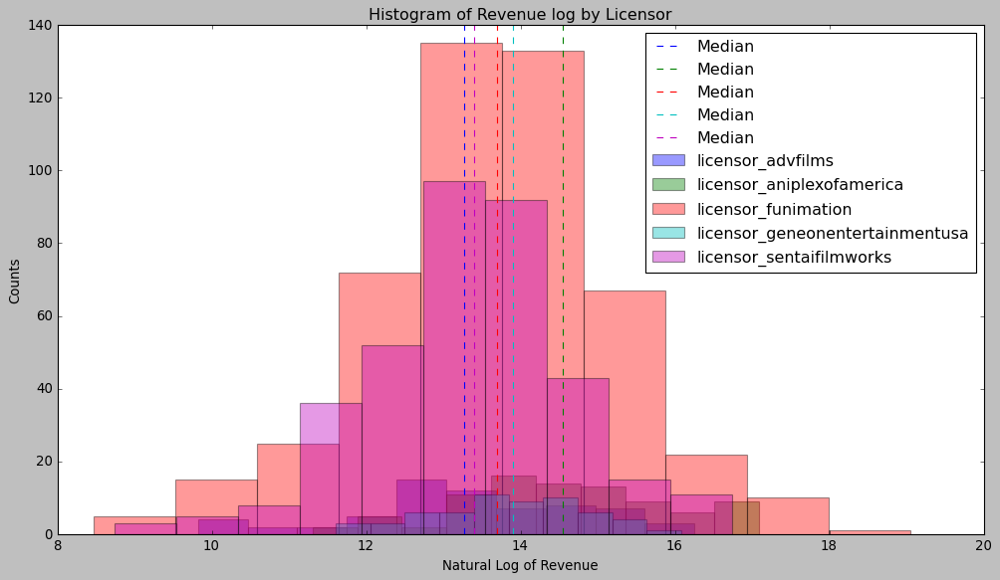

In [106]:
#Create list to get unique variables from df_licensor
list_columns = []
for value in df_licensor.columns:
    
    #keep only those with more than 50 count
    if df_licensor[value].sum()>50:
        list_columns.append(value)

plt.figure(figsize=(15,8))

#plot histogram per unique variable under feature
for i,value in enumerate(list_columns[0:]):
    condition = df_licensor[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
    
plt.title('Histogram of Revenue log by Licensor')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()




#### Take away: ###
- Median revenue per Advfilms, Funimation, Geneon Entertainment, and Senta Film Works Licensors appear to be similar.
- Median of Revenue per Aniplex of America appears to be higher than the other Licensor.

#### Anime Studio  

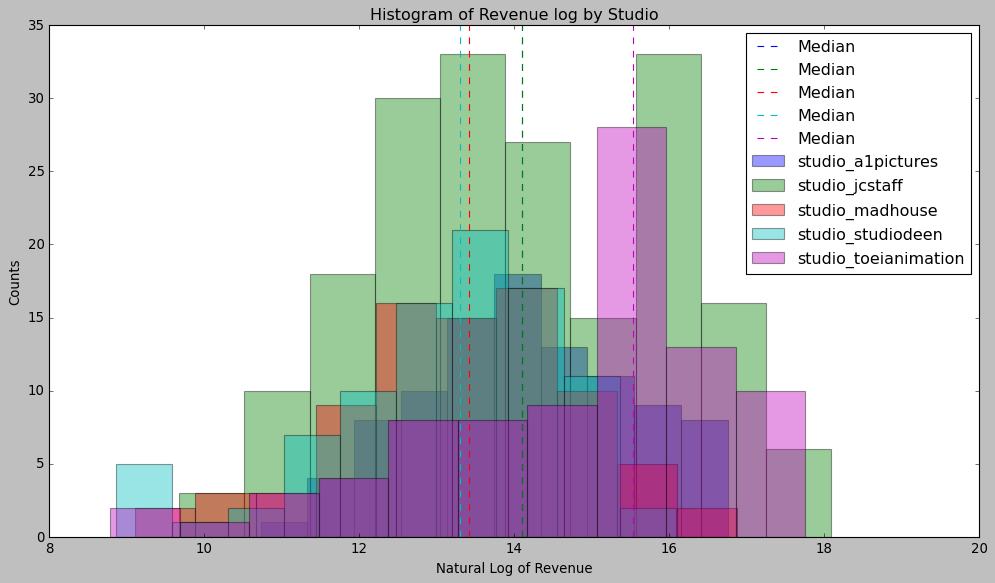

In [107]:
#Create list to get unique variables from df_studio
list_columns = []
for value in df_studio.columns:
    
    if df_studio[value].sum()>80:
        list_columns.append(value)

plt.figure(figsize=(15,8))
 
#plot histogram per unique variable under feature
for i,value in enumerate(list_columns[0:]):
    
    condition = df_studio[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
    
plt.title('Histogram of Revenue log by Studio')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()




#### Take away: ###

- Median of Revenue per Toei Animation Studio appears to be higher than the other studio.

#### Anime Publisher  

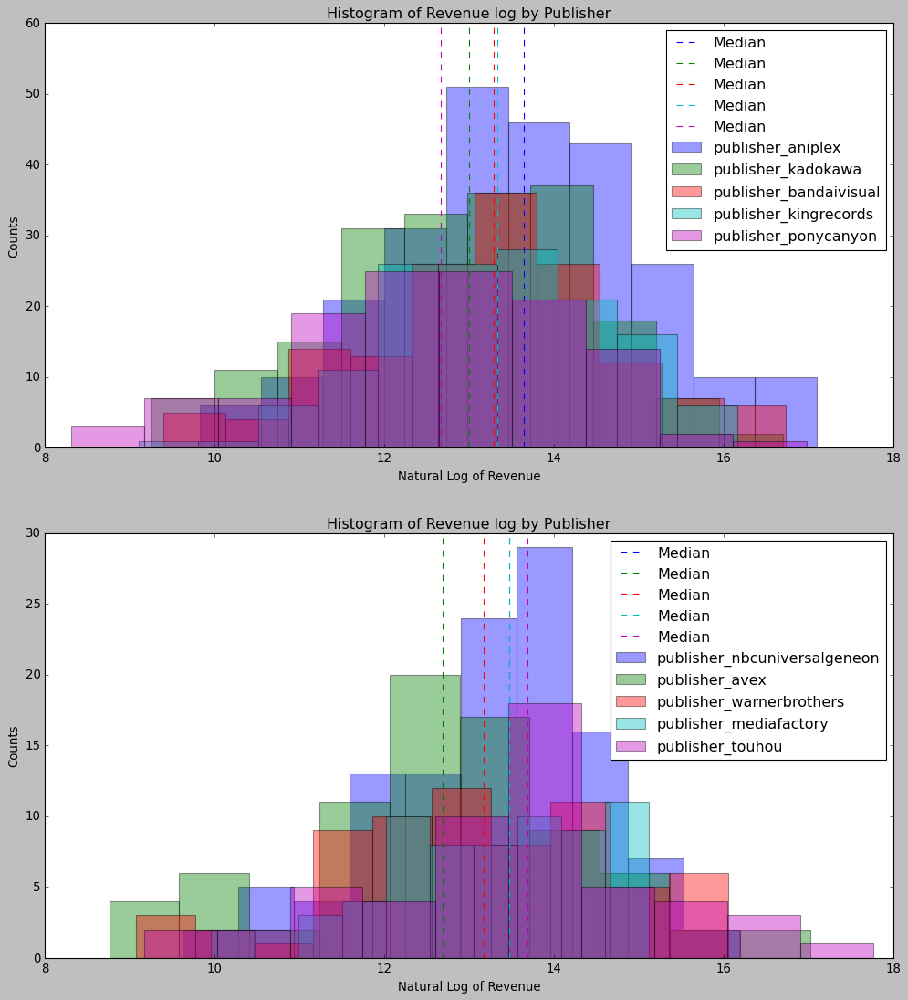

In [108]:
#Create dict to get unique variables from df_publisher
dict_columns = {}
for value in df_publisher.columns:
    
    #Keep only those with at least 51 count
    if df_publisher[value].sum()>50:
        dict_columns[value] = df_publisher[value].sum()
        
#Create a list of the key and value from dict_columns
key_list = list(dict_columns.keys())        
val_list = list(dict_columns.values())

#Sort and keep top 10
val_list_10 = sorted(val_list,reverse=True)[0:10]

#Iterate to get keys (unique features from df_publisher)
list_columns =[]
for value in val_list_10:
    position = val_list.index(value)
    list_columns.append(key_list[position])

    
#plot histogram per unique variable under feature
#Create subplot to fit multiple histgrams 
    #Plot first 5 variables
plt.subplots(2,1,figsize=(15,16))
plt.subplot(2,1,1)
for i,value in enumerate(list_columns[0:5]):
    condition = df_publisher[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
    
    
plt.title('Histogram of Revenue log by Publisher')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()

    #Plot next 5 variables
plt.subplot(2,1,2)
for i,value in enumerate(list_columns[5:10]):
    condition = df_publisher[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])    

plt.title('Histogram of Revenue log by Publisher')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()

#### Take away: ###
- Distribution of Revenue per publisher appear to be very similar 
- Medians of the revenues do not differ greatly

#### Anime Distributor  

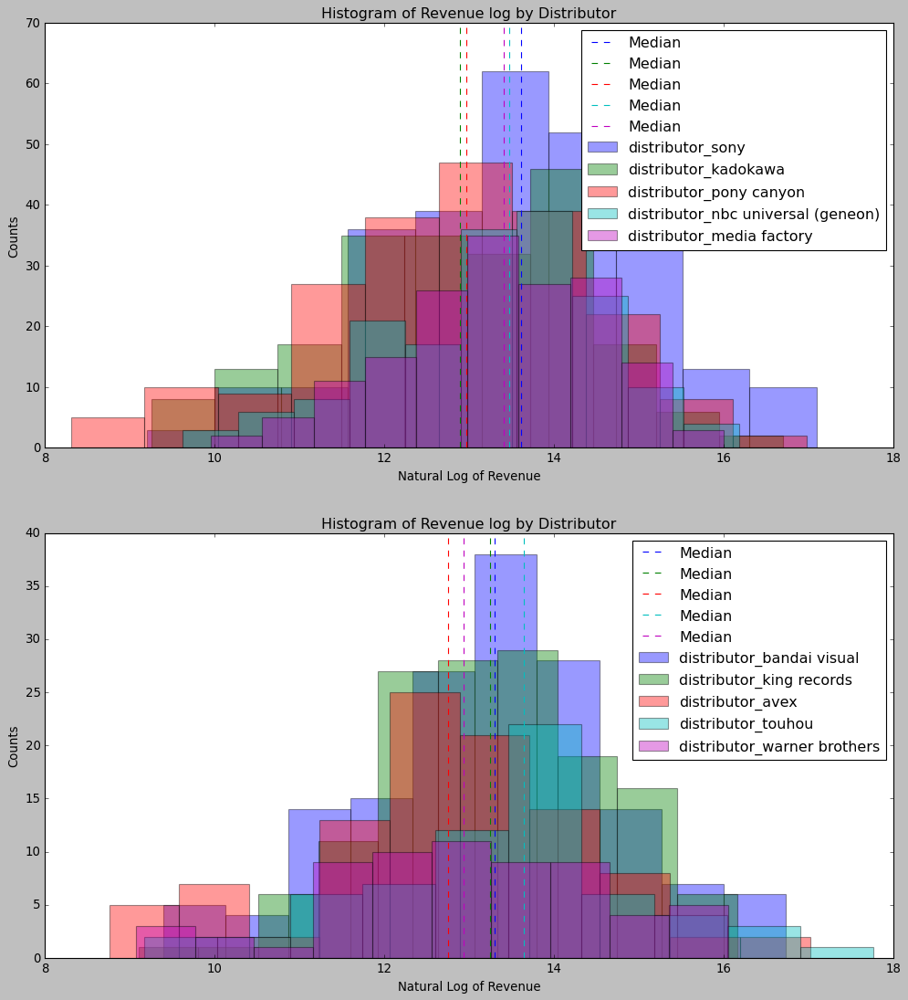

In [109]:
#Create dict to get unique variables from df_distributor
dict_columns = {}
for value in df_distributor.columns:
    
    #Keep only those with at least 51 count
    if df_distributor[value].sum()>50:
        dict_columns[value] = df_distributor[value].sum()
        
#Create a list of the key and value from dict_columns        
key_list = list(dict_columns.keys())        
val_list = list(dict_columns.values())

#Sort and keep top 10
val_list_10 = sorted(val_list,reverse=True)[0:10]

#Iterate to get keys (unique features from df_publisher)
list_columns =[]
for value in val_list_10:
    position = val_list.index(value)
    list_columns.append(key_list[position])

        
#plot histogram per unique variable under feature
#Create subplot to fit multiple histgrams 
    #Plot first 5 variables
plt.subplots(2,1,figsize=(15,16))
plt.subplot(2,1,1)
for i,value in enumerate(list_columns[0:5]):
    condition = df_distributor[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])

plt.title('Histogram of Revenue log by Distributor')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()

    #Plot next 5 variables
plt.subplot(2,1,2)
for i,value in enumerate(list_columns[5:10]):
    condition = df_distributor[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
    
plt.title('Histogram of Revenue log by Distributor')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()

#### Take away: ###
- Distribution of Revenue per Distributor appear to be  similar 
- Medians of the revenues do not differ greatly

#### Anime Related Keys  

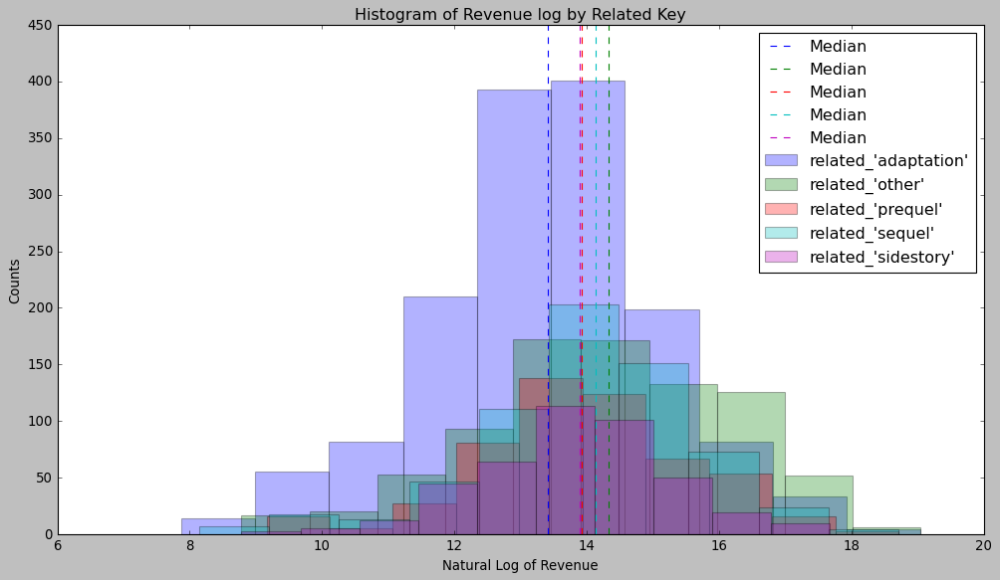

In [110]:
#Create list to get unique variables from df_related
list_columns = []
for value in df_related.columns:
    
    if df_related[value].sum()>50:
        list_columns.append(value)
        
#plot histogram per unique variable under feature
plt.figure(figsize=(15,8))
for i,value in enumerate(list_columns):
    condition = df_related[value]==1
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.3)
    color = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
    
plt.title('Histogram of Revenue log by Related Key')
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()
plt.show()




#### Take away: ###

- Median revenue per related keys appears to be centered similarly among all unique keys. 
- Size of total frequency differs greatly between adaptation and all other keys.

### Numeric data against Revenue (Target) 

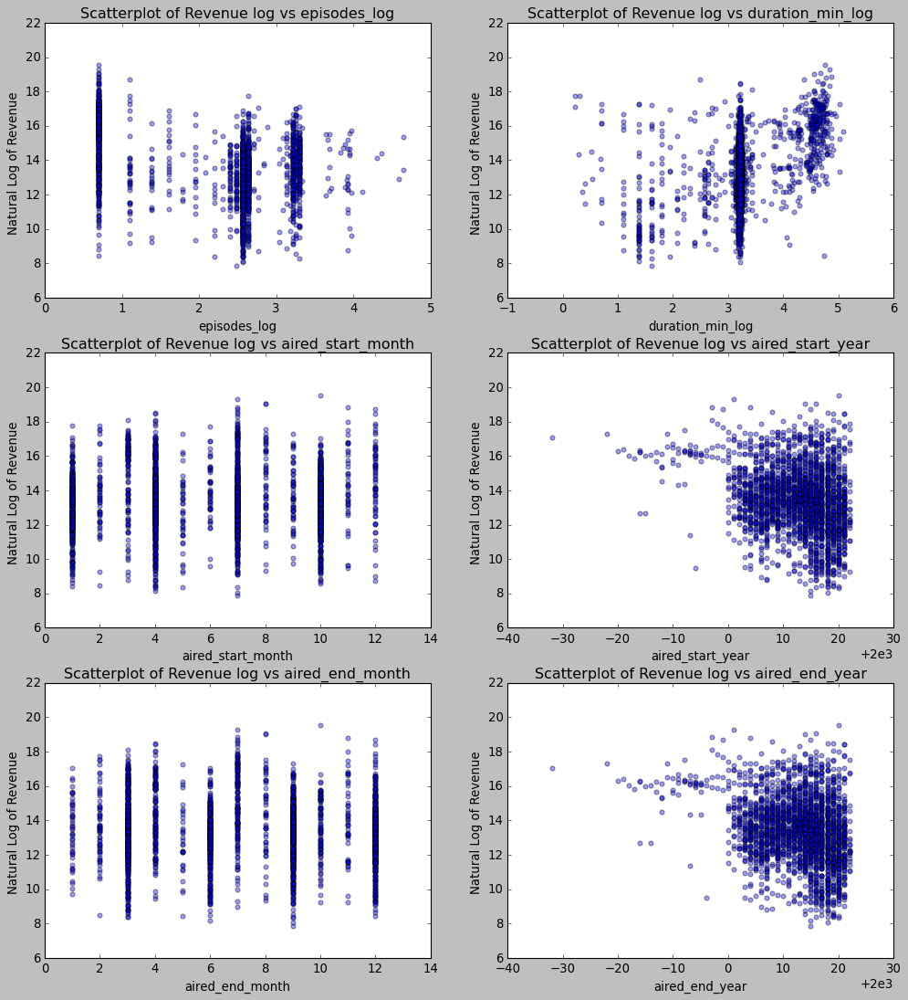

In [111]:
df_numeric =df_import.select_dtypes(include = ['float','int']).drop(columns=['episodes','duration_min','revenue_log']).copy()

cols = df_numeric.columns

plt.subplots(3,2,figsize=(15,16))

for i,column in enumerate(cols):
    plt.subplot(3,2,i+1)
    plt.scatter(df_import.loc[:,column],df_import.loc[:,'revenue_log'],label = value,alpha=0.4)
    plt.title(f'Scatterplot of Revenue log vs {column}')
    plt.xlabel(f'{column}')
    plt.ylabel('Natural Log of Revenue ')
plt.show()

#### Take away: ###
- For aired year (start and end), the data appears to be concentrated in the between 2000 and 2020. The range of the revenue (log) is varies greatly. Those that aired earlier than 2000 appear to stay strong at around 16 and 18 revenue (log).
- For duration, there appears to be a positive relationship developing with revenue. 
- For aired month, values appear to be be clustered. These values will be preferred to be observed as histograms.
- For episode, there appears to be a negative relationship against revenue (log) 

#### Evaluate Aired Start Month  and End Month with histograms 

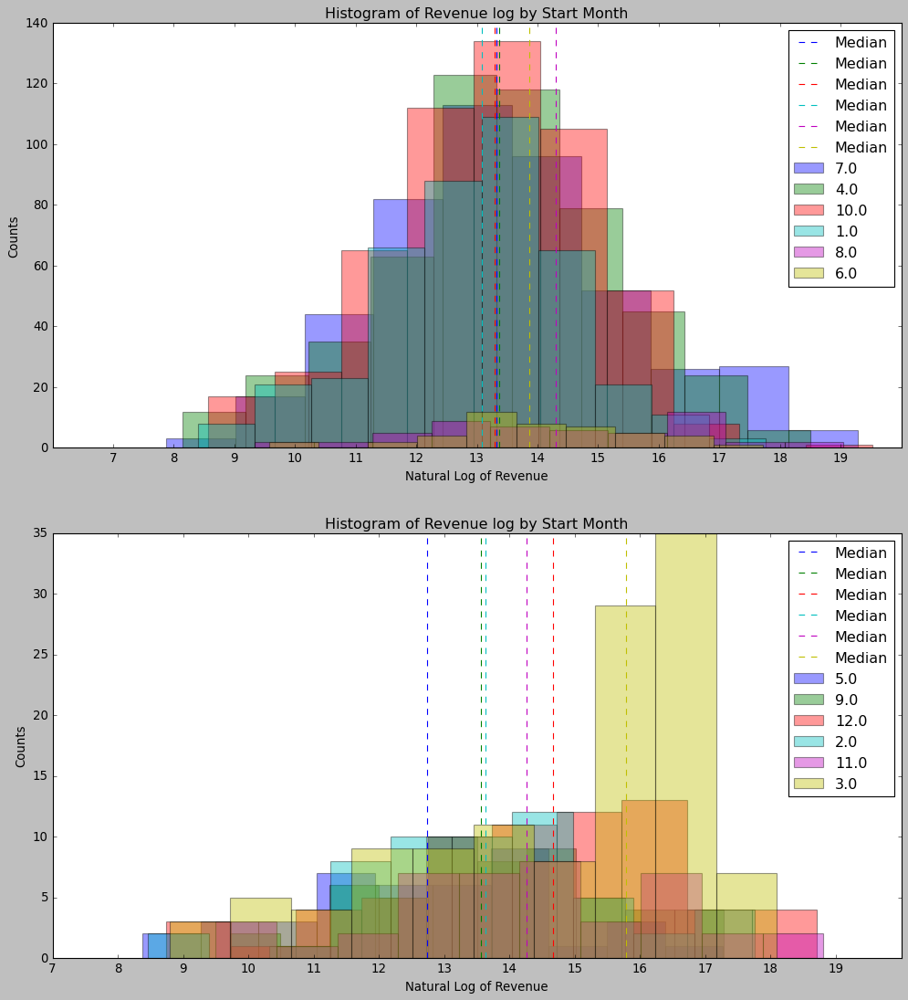

In [112]:
plt.subplots(2,1,figsize=(15,16))
plt.subplot(2,1,1)
# Create 2 Histogram plots for all source types 
    #Iterate Plot per unique values (first 6)
for i,value in enumerate(df_import['aired_start_month'].unique()[0:6]):
    condition = df_import['aired_start_month']==value
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color=plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
plt.title('Histogram of Revenue log by Start Month')
plt.xticks(np.arange(7,20))
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()


plt.subplot(2,1,2)
 #Iterate Plot per unique values (last 6)
for i,value in enumerate(df_import['aired_start_month'].unique()[6:]):
    condition = df_import['aired_start_month']==value
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color=plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
plt.title('Histogram of Revenue log by Start Month')
plt.xlabel('Natural Log of Revenue')
plt.xticks(np.arange(7,20))
plt.ylabel('Counts')
plt.legend()
plt.show()

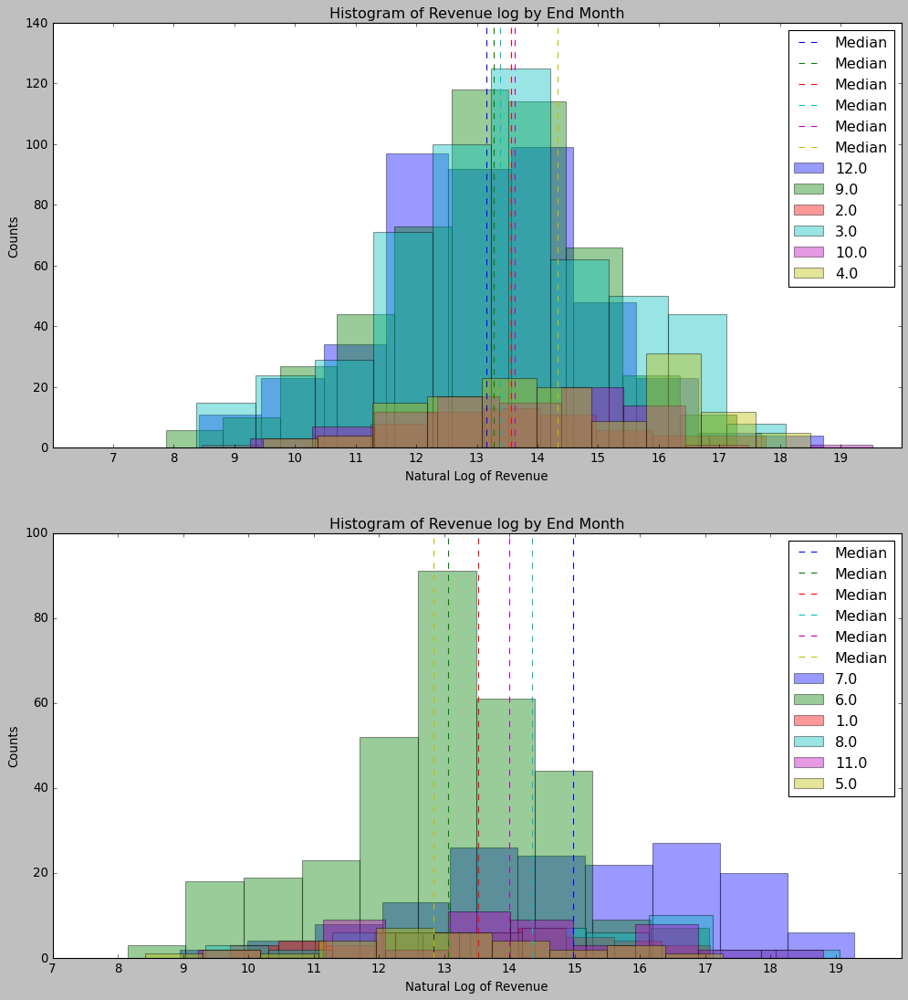

In [113]:
plt.subplots(2,1,figsize=(15,16))
plt.subplot(2,1,1)
# Create 2 Histogram plots for all source types 
    #Iterate Plot per unique values (first 6)
for i,value in enumerate(df_import['aired_end_month'].unique()[0:6]):
    condition = df_import['aired_end_month']==value
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color=plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
plt.title('Histogram of Revenue log by End Month')
plt.xticks(np.arange(7,20))
plt.xlabel('Natural Log of Revenue')
plt.ylabel('Counts')
plt.legend()


plt.subplot(2,1,2)
 #Iterate Plot per unique values (last 6)
for i,value in enumerate(df_import['aired_end_month'].unique()[6:]):
    condition = df_import['aired_end_month']==value
    plt.hist(df_import.loc[condition,'revenue_log'],label = value,alpha=0.4)
    color=plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.axvline(df_import.loc[condition,'revenue_log'].median(), linestyle='dashed',label='Median',color=color[i])
plt.title('Histogram of Revenue log by End Month')
plt.xlabel('Natural Log of Revenue')
plt.xticks(np.arange(7,20))
plt.ylabel('Counts')
plt.legend()
plt.show()

#### Take away: ###
- March (3) has the best median revenue per anime start month.
- July (7) has the best median revenue per anime end month.
- Median revenue per related keys appears to be centered similarly among months with high count volume. 


## Evaluate for correlations ## 


Insights  between features will be focus of this section. The following will be explored:

1) Pairplot of the Numeric data 

2) Correlation of the Numeric data

### Pair Plots ###

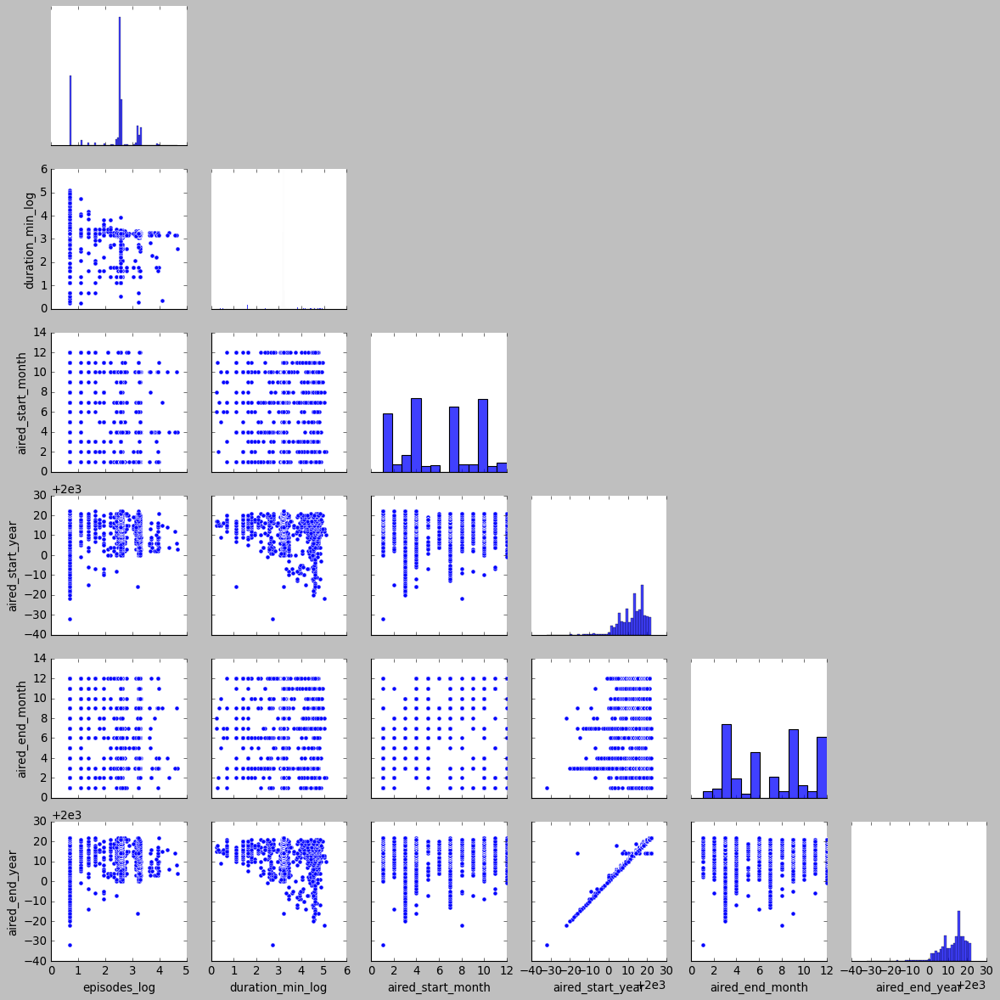

In [114]:
#Pairplot
sns.pairplot(df_import.select_dtypes(include = ['float','int']).drop(columns=['episodes','duration_min','revenue_log']), corner=True)
plt.show()

**Take away:**
- Aired Start year and End Year appear to be strongly correlated 
- Episodes and duration appear to be somewhat correlated against aired start year.

### Correlation Heatmap

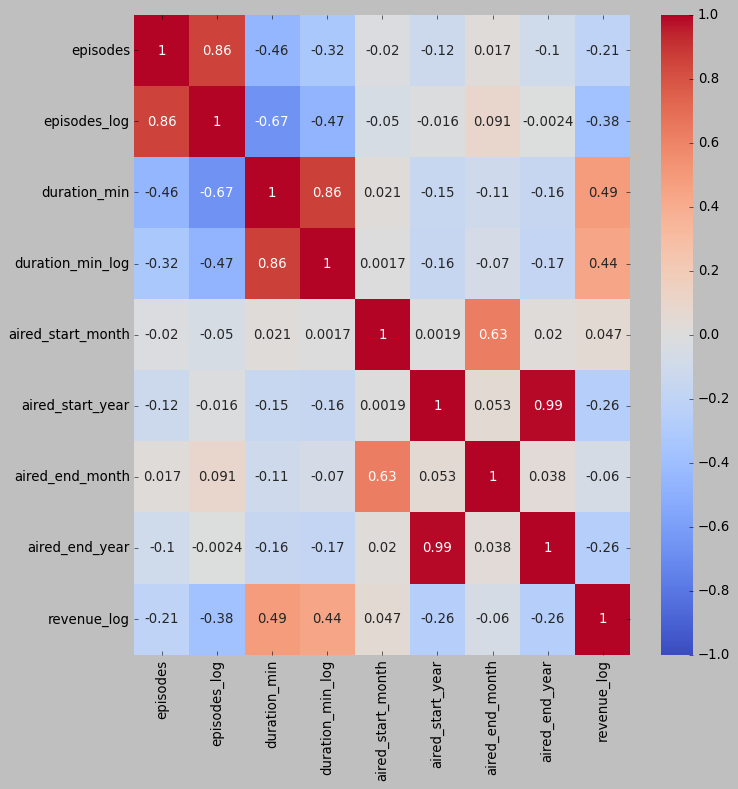

In [115]:
plt.figure(figsize = (10,10))
sns.heatmap(df_import.corr(),vmin=-1, vmax=1, cmap='coolwarm', annot=True);
sns.heatmap;

**Take away:**
- Aired Start year and End Year are strongly correlated. Aired End year can be dropped. 
- Episodes and duration are modestly correlated against aired start year.
- Aired Start year and End Year are modestly correlated 
- Episodes and duration are modestly correlated.

In [116]:
#drop aired end year
df_import.drop(columns='aired_end_year',inplace = True)

## Finalize Dataframe for Modeling ## 

The dataframe as part of EDA will be finalized for the modeling processing of the project. The following will be done:

1) Create dummy variables for `Type`, `Source`, and `Rating`.

2) Combine all datframe with dummy variable to main dataframe (df_import) and create new dataframe (final_df).

3) Create file path and write a new csv file for final_df.

### Finalize all dummy variables

Create one hot encode for type, source, rating 



In [117]:
from sklearn.preprocessing import OneHotEncoder

In [118]:
#type
ohe = OneHotEncoder()
df_type_sub = pd.DataFrame(df_import['type'])
encoded = ohe.fit_transform(df_type_sub)
dense_array = encoded.toarray()
df_type = pd.DataFrame(dense_array, columns=ohe.categories_, dtype=int)
df_type= df_type.add_prefix('type_')
##df_type.drop(columns='type_Other', inplace =True)

df_type.head()

,type_Movie,type_Other,type_TV
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1


In [119]:
#source
ohe = OneHotEncoder()
df_source_sub = pd.DataFrame(df_import['source'])
encoded = ohe.fit_transform(df_source_sub)
dense_array = encoded.toarray()
df_source = pd.DataFrame(dense_array, columns=ohe.categories_, dtype=int)
df_source= df_source.add_prefix('source_')
##df_source.drop(columns='source_Other', inplace=True)

df_source.head()


,source_Game,source_Light novel,source_Manga,source_Original,source_Other,source_Other Novel/Book,source_Other manga
0,0,0,0,1,0,0,0
1,0,0,1,0,0,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0


In [120]:
#rating
ohe = OneHotEncoder()
df_rating_sub = pd.DataFrame(df_import['rating'])
encoded = ohe.fit_transform(df_rating_sub)
dense_array = encoded.toarray()
df_rating = pd.DataFrame(dense_array, columns=ohe.categories_, dtype=int)
df_rating= df_rating.add_prefix('rating_')
##df_rating.drop(columns='rating_Unknown',inplace=True)
df_rating.head()

,rating_G - All Ages,rating_PG-13 - Teens 13 or older,rating_R rating,rating_Unknown
0,0,1,0,0
1,0,1,0,0
2,0,1,0,0
3,1,0,0,0
4,0,1,0,0


### Concatenate all dummies to main dataframe

In [121]:
#concat as needed 
final_df= pd.concat([df_import,df_type,df_source,df_rating,df_related,df_producer,df_licensor,df_studio,df_genre,\
                      df_publisher,df_distributor], axis=1)


final_df.drop(columns = ['type','source','rating','related_keys','producer','licensor','studio','genre',\
                          'Animation Studio','Publisher','Distributor'], inplace = True)

The following will verify that dataframe was correctly concated.

In [122]:
display(final_df.head())
display(final_df.shape)

,title,episodes,2_synopsis,episodes_log,duration_min,duration_min_log,aired_start_month,aired_start_year,aired_end_month,revenue_log,...,distributor_kadokawa,distributor_king records,distributor_media factory,distributor_nbc universal (geneon),distributor_pony canyon,distributor_sony,distributor_touhou,distributor_vap,distributor_victor entertainment,distributor_warner brothers
0,witch hunter robin,26.0,Witches are individuals with special powers li...,3.295837,25.0,3.258097,7.0,2002.0,12.0,13.986646,...,0,0,0,0,0,0,0,0,0,0
1,hachimitsu to clover,24.0,"Yuuta Takemoto, a sophomore at an arts college...",3.218876,23.0,3.178054,4.0,2005.0,9.0,15.048370,...,1,0,0,0,0,0,0,0,0,0
2,initial d fourth stage,24.0,Takumi Fujiwara finally joins Ryousuke and Kei...,3.218876,27.0,3.332205,4.0,2004.0,2.0,16.435096,...,0,0,0,0,0,0,0,0,0,0
3,ring ni kakero 1,12.0,"In order to fulfill their dead father's wish, ...",2.564949,25.0,3.258097,10.0,2004.0,12.0,12.444601,...,0,0,0,0,0,0,0,0,0,0
4,school rumble,26.0,"Just the words ""I love you,"" and everything ch...",3.295837,23.0,3.178054,10.0,2004.0,3.0,14.909663,...,0,0,1,0,0,0,0,0,0,0


(2404, 195)

## Send Data to csv file 

In [123]:
from pathlib import Path  

filepath = Path('data_for_model/final_df.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True)  
final_df.to_csv(filepath)  

## Conclusion 

The data has been prepared for modeling. All data features except `2_synopsis` and `title` has been quantified. Exploration of the data has shown that there is a lot of categorical data that required to be condensed. Normality shape of the frequency distribution and significant volume of unique variable per category were key to determine what stayed. As the data set contained a lot categorical data, the dimension of the feature increased significantly to fit dummy variables for the categorical data. 

Numeric data were explored and some features including revenue required natural log transformation. This helped to maintain a bell shape curve in the data. Correlation what explored to reduce multi-collinearity.

EDA showed that type, month of release, number of episodes, and length of episode may have significant impact determining revenue.